<a href="https://colab.research.google.com/github/realV1LL4/Deep-Learning/blob/Corte-2/DermaMNIST_vs_Architectures.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



---


# Inicializador


> - Carga de librerias
> - Descarga del dataset
> - Configuracion de hiperparametros


Carga de librerias

In [1]:
%pip install medmnist

import torch
import gc
import torch.nn as nn
import numpy as np
from tqdm import tqdm
import torch.optim as optim
import torchvision.models as models
from torch.utils.data import DataLoader
from torchvision import transforms, utils
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from medmnist import DermaMNIST, Evaluator

Configuracion de hiperparámetros

In [2]:
input_resolution = 224
input_size = 3 * 224 * 224  # 3 canales RGB de 224x224
num_classes = 7  # Número de clases en DermaMNIST
num_epochs = 30
batch_size = 256
learning_rate = 0.001
weight_decay = 1e-4

Descarga del dataset DermaMNIST y creacion de "DataLoaders" normalizados

In [3]:
# Transformaciones aumentadas para entrenamiento
dataAUG_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),    # Volteo horizontal 50%
    transforms.RandomVerticalFlip(p=0.5),      # Volteo vertical 50%
    transforms.Pad(
        padding=30, # Pixeles agregados al borde
        padding_mode='reflect' # Tipo de relleno
    ),
    transforms.RandomRotation(degrees=15),     # Rotación ±15 grados
    transforms.CenterCrop(input_resolution),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

# preprocessing
data_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[.5], std=[.5])
])

# Descarga y division dataset
trainAUG_dataset = DermaMNIST(split="train", transform=dataAUG_transform, download=True, size=input_resolution) #DataAug
train_dataset = DermaMNIST(split="train", transform=data_transform, download=True, size=input_resolution)
val_dataset = DermaMNIST(split="val", transform=data_transform, download=True, size=input_resolution)
test_dataset = DermaMNIST(split="test", transform=data_transform, download=True, size=input_resolution)

# Crear DataLoaders
trainAUG_loader = DataLoader(trainAUG_dataset, batch_size=batch_size, shuffle=True) #DataAug
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

Informacion splits del dataset (entrenamiento, validacion y prueba)

In [4]:
print(train_dataset)
print("===================")
print(val_dataset)
print("===================")
print(test_dataset)

Dataset DermaMNIST of size 224 (dermamnist_224)
    Number of datapoints: 7007
    Root location: /root/.medmnist
    Split: train
    Task: multi-class
    Number of channels: 3
    Meaning of labels: {'0': 'actinic keratoses and intraepithelial carcinoma', '1': 'basal cell carcinoma', '2': 'benign keratosis-like lesions', '3': 'dermatofibroma', '4': 'melanoma', '5': 'melanocytic nevi', '6': 'vascular lesions'}
    Number of samples: {'train': 7007, 'val': 1003, 'test': 2005}
    Description: The DermaMNIST is based on the HAM10000, a large collection of multi-source dermatoscopic images of common pigmented skin lesions. The dataset consists of 10,015 dermatoscopic images categorized as 7 different diseases, formulized as a multi-class classification task. We split the images into training, validation and test set with a ratio of 7:1:2. The source images of 3×600×450 are resized into 3×28×28.
    License: CC BY-NC 4.0
Dataset DermaMNIST of size 224 (dermamnist_224)
    Number of datap

Ilustracion del contenido almacenado en el dataset

Sin Data-Augmentation:


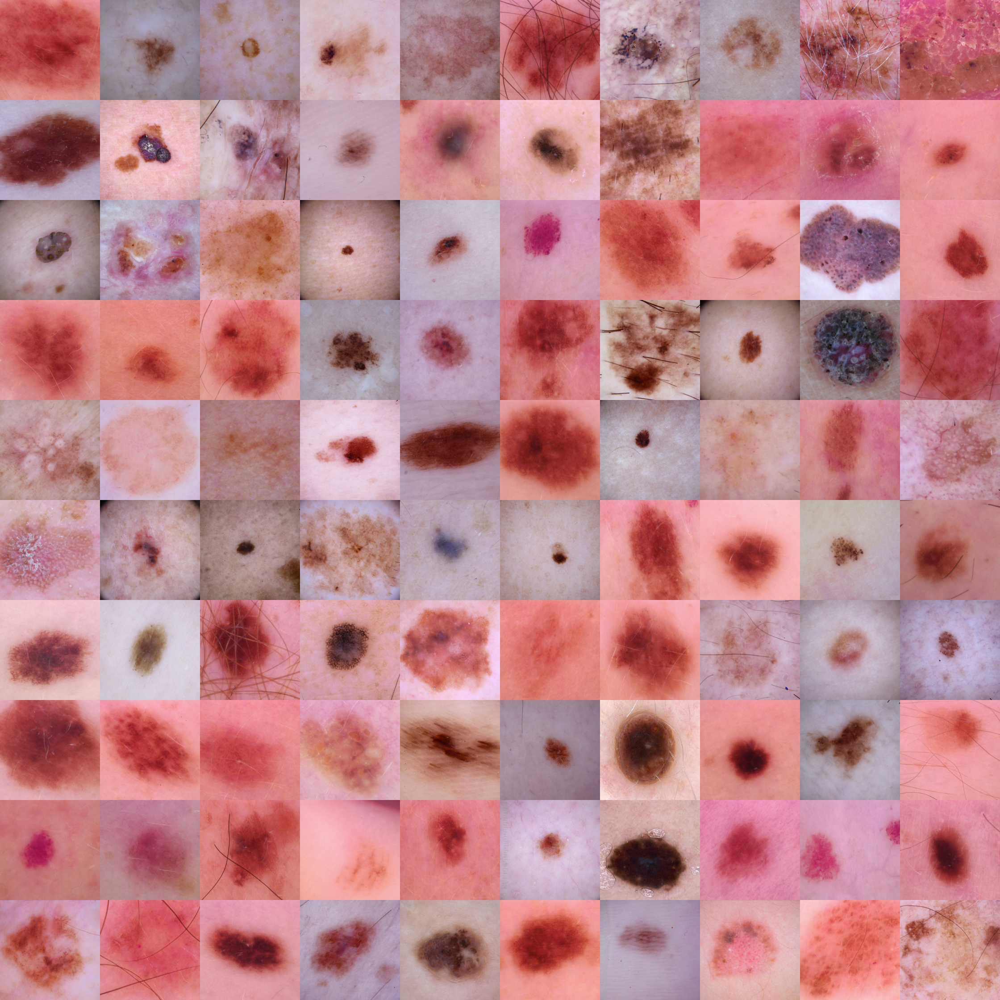

In [5]:
print("Sin Data-Augmentation:")
train_dataset.montage(length=10)

Con Data-Augmentation:


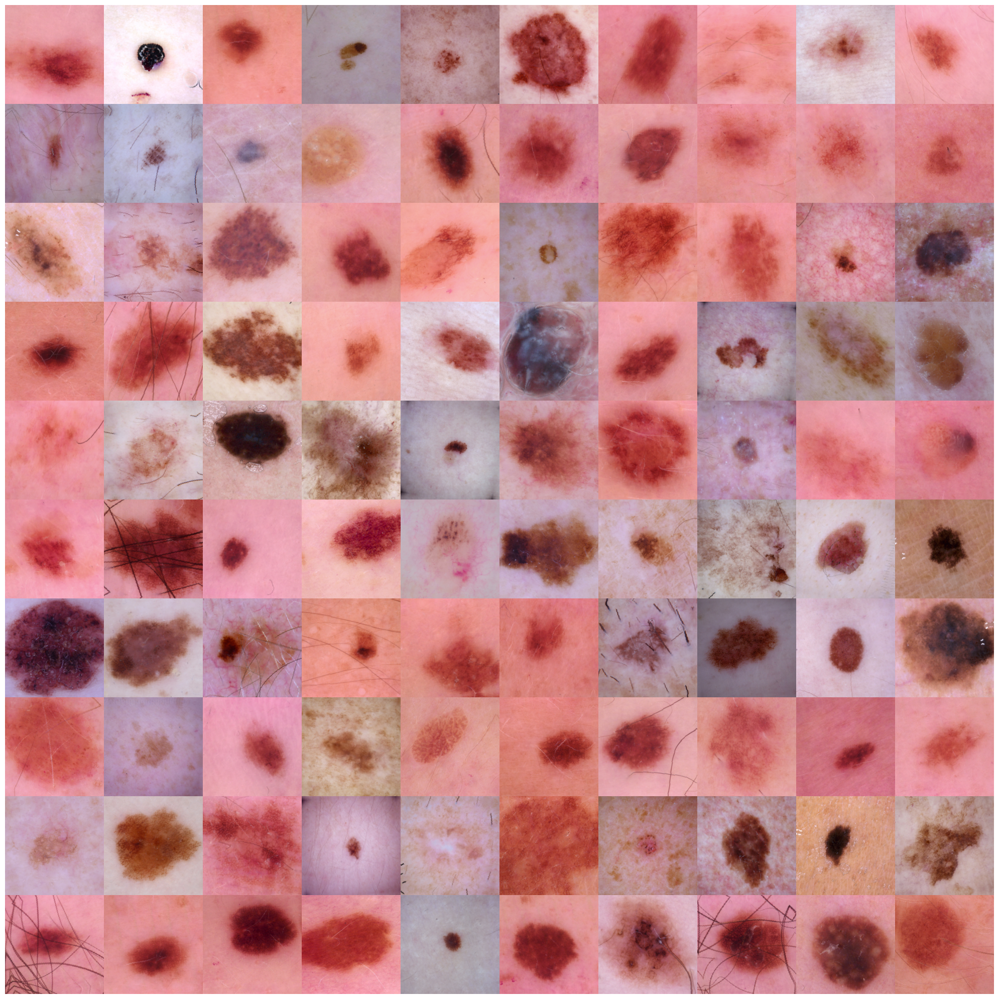

In [6]:
print("Con Data-Augmentation:")

# Configurar figura sin espacios
fig, axes = plt.subplots(10, 10, figsize=(20, 20),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw={'wspace':0, 'hspace':0})

# Aplanar el array de ejes para iterar
axes = axes.ravel()

# Obtener 100 imágenes del DataLoader (batch_size debe ser >=100)
images, _ = next(iter(trainAUG_loader))

for i in range(100):  # 10x10 = 100 imágenes
    # Desnormalización y preparación
    img = images[i].numpy().transpose((1, 2, 0))
    img = img * 0.5 + 0.5  # Revertir normalización

    # Mostrar sin bordes/espacios
    axes[i].imshow(img.squeeze(), cmap='gray', aspect='auto')
    axes[i].axis('off')

# Ajustar márgenes y mostrar
plt.subplots_adjust(left=0, right=1, bottom=0, top=1, wspace=0, hspace=0)
plt.tight_layout()
plt.show()

---

# 1. MLP

> - Train -> ACC=  AUC=  
> - Val ----> ACC=  AUC=  
> - Test --> ACC=  AUC=  

Layers:

\begin{array}{c}
\text{input_size} \\
\downarrow \\
\mathrm{FC}_{\text{4096}} \rightarrow \text{BatchNorm} \rightarrow \text{ReLU}\\
\downarrow \\
\mathrm{FC}_{\text{1024}} \rightarrow \text{BatchNorm} \rightarrow \text{ReLU}\\
\downarrow \\
\mathrm{FC}_{\text{256}} \rightarrow \text{BatchNorm} \rightarrow \text{ReLU}\\
\downarrow \\
\mathrm{FC}_{\text{num_classes}}
\end{array}

Arquitectura del modelo

In [7]:
# Verificar dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Definir la arquitectura MLP
class MLP(nn.Module):
    def __init__(self, input_size, num_classes):
        super(MLP, self).__init__()
        # Capa 1
        self.fc1 = nn.Linear(input_size, 4096)
        self.bn1 = nn.BatchNorm1d(4096)  # BatchNorm
        self.relu1 = nn.ReLU()

        # Capa 2
        self.fc2 = nn.Linear(4096, 1024)
        self.bn2 = nn.BatchNorm1d(1024)
        self.relu2 = nn.ReLU()

        # Capa 3
        self.fc3 = nn.Linear(1024, 256)
        self.bn3 = nn.BatchNorm1d(256)
        self.relu3 = nn.ReLU()

        # Capa de salida
        self.fc4 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = x.view(x.size(0), -1)  # Aplanar la imagen

        x = self.fc1(x)
        x = self.bn1(x)
        x = self.relu1(x)

        x = self.fc2(x)
        x = self.bn2(x)
        x = self.relu2(x)

        x = self.fc3(x)
        x = self.bn3(x)
        x = self.relu3(x)

        x = self.fc4(x)
        return x

# Inicializar modelo
model = MLP(input_size, num_classes).to(device)

# Función de pérdida y optimizador
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

Entrenamiento del modelo con validacion

In [8]:
def entrenar_modelo(model, train_loader, val_loader, criterion, optimizer, num_epochs, device):
    # Históricos de métricas
    train_accuracy_history = []
    val_accuracy_history = []
    train_auc_history = []
    val_auc_history = []

    for epoch in range(num_epochs):
        # ========== Entrenamiento ==========
        model.train()
        correct_train, total_train = 0, 0
        all_train_probs = []
        all_train_labels = []

        # Barra de progreso entrenamiento
        train_bar = tqdm(train_loader, desc=f'Época {epoch+1}/{num_epochs} [Entrenamiento]', unit='batch')
        for images, labels in train_bar:
            images = images.to(device)
            labels = labels.to(device).squeeze().long()

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)

            # Backpropagación
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Métricas
            _, predicted = torch.max(outputs.data, 1)
            batch_total = labels.size(0)
            batch_correct = (predicted == labels).sum().item()

            correct_train += batch_correct
            total_train += batch_total
            probs = torch.softmax(outputs, dim=1)

            all_train_probs.extend(probs.cpu().detach().numpy())
            all_train_labels.extend(labels.cpu().numpy())

            # Actualizar progreso
            train_bar.set_postfix(
                pérdida=f"{loss.item():.4f}",
                precisión_lote=f"{batch_correct/batch_total:.3f}"
            )

        # Métricas finales entrenamiento
        epoch_train_acc = correct_train / total_train
        train_auc = roc_auc_score(all_train_labels, all_train_probs, multi_class='ovr', average='macro')
        train_accuracy_history.append(epoch_train_acc)
        train_auc_history.append(train_auc)

        # ========== Validación ==========
        model.eval()
        correct_val, total_val = 0, 0
        all_val_probs = []
        all_val_labels = []

        # Barra de progreso validacion
        val_bar = tqdm(val_loader, desc=f'Época {epoch+1}/{num_epochs} [Validación]', unit='batch')
        with torch.no_grad():
            for images, labels in val_bar:
                images = images.to(device)
                labels = labels.to(device).squeeze().long()

                outputs = model(images)

                # Métricas
                probs = torch.softmax(outputs, dim=1)
                all_val_probs.extend(probs.cpu().numpy())
                all_val_labels.extend(labels.cpu().numpy())

                _, predicted = torch.max(outputs.data, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

                val_bar.set_postfix(precisión_lote=f"{correct_val/total_val:.3f}")

        # Métricas finales validación
        epoch_val_acc = correct_val / total_val
        val_auc = roc_auc_score(all_val_labels, all_val_probs, multi_class='ovr', average='macro')
        val_accuracy_history.append(epoch_val_acc)
        val_auc_history.append(val_auc)

        print(f"\nRESUMEN ÉPOCA {epoch+1}/{num_epochs}:")
        print(f"Entrenamiento - ACC: {epoch_train_acc:.4f} | AUC: {train_auc:.4f}")
        print(f"Validación    - ACC: {epoch_val_acc:.4f} | AUC: {val_auc:.4f}\n")

    return train_accuracy_history, val_accuracy_history, train_auc_history, val_auc_history

train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist = entrenar_modelo(
    model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    num_epochs,
    device
)

Época 1/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.45batch/s, precisión_lote=0.675]



RESUMEN ÉPOCA 1/30:
Entrenamiento - ACC: 0.6239 | AUC: 0.7363
Validación    - ACC: 0.6750 | AUC: 0.8107



Época 2/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.50batch/s, precisión_lote=0.711]



RESUMEN ÉPOCA 2/30:
Entrenamiento - ACC: 0.6970 | AUC: 0.8213
Validación    - ACC: 0.7109 | AUC: 0.8508



Época 3/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.64batch/s, precisión_lote=0.711]



RESUMEN ÉPOCA 3/30:
Entrenamiento - ACC: 0.7022 | AUC: 0.8444
Validación    - ACC: 0.7109 | AUC: 0.8504



Época 4/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.72batch/s, precisión_lote=0.720]



RESUMEN ÉPOCA 4/30:
Entrenamiento - ACC: 0.7050 | AUC: 0.8561
Validación    - ACC: 0.7198 | AUC: 0.8644



Época 5/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.65batch/s, precisión_lote=0.716]



RESUMEN ÉPOCA 5/30:
Entrenamiento - ACC: 0.7116 | AUC: 0.8736
Validación    - ACC: 0.7159 | AUC: 0.8728



Época 6/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.66batch/s, precisión_lote=0.719]



RESUMEN ÉPOCA 6/30:
Entrenamiento - ACC: 0.7184 | AUC: 0.8816
Validación    - ACC: 0.7188 | AUC: 0.8768



Época 7/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.63batch/s, precisión_lote=0.726]



RESUMEN ÉPOCA 7/30:
Entrenamiento - ACC: 0.7266 | AUC: 0.8919
Validación    - ACC: 0.7258 | AUC: 0.8759



Época 8/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.45batch/s, precisión_lote=0.713]



RESUMEN ÉPOCA 8/30:
Entrenamiento - ACC: 0.7393 | AUC: 0.9010
Validación    - ACC: 0.7129 | AUC: 0.8800



Época 9/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.70batch/s, precisión_lote=0.725]



RESUMEN ÉPOCA 9/30:
Entrenamiento - ACC: 0.7500 | AUC: 0.9134
Validación    - ACC: 0.7248 | AUC: 0.8798



Época 10/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.53batch/s, precisión_lote=0.729]



RESUMEN ÉPOCA 10/30:
Entrenamiento - ACC: 0.7580 | AUC: 0.9224
Validación    - ACC: 0.7288 | AUC: 0.8933



Época 11/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.67batch/s, precisión_lote=0.733]



RESUMEN ÉPOCA 11/30:
Entrenamiento - ACC: 0.7754 | AUC: 0.9323
Validación    - ACC: 0.7328 | AUC: 0.8949



Época 12/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.57batch/s, precisión_lote=0.718]



RESUMEN ÉPOCA 12/30:
Entrenamiento - ACC: 0.7896 | AUC: 0.9438
Validación    - ACC: 0.7178 | AUC: 0.8905



Época 13/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.61batch/s, precisión_lote=0.710]



RESUMEN ÉPOCA 13/30:
Entrenamiento - ACC: 0.8059 | AUC: 0.9493
Validación    - ACC: 0.7099 | AUC: 0.8926



Época 14/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.64batch/s, precisión_lote=0.738]



RESUMEN ÉPOCA 14/30:
Entrenamiento - ACC: 0.8203 | AUC: 0.9579
Validación    - ACC: 0.7378 | AUC: 0.8931



Época 15/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.66batch/s, precisión_lote=0.685]



RESUMEN ÉPOCA 15/30:
Entrenamiento - ACC: 0.8402 | AUC: 0.9683
Validación    - ACC: 0.6849 | AUC: 0.8892



Época 16/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.51batch/s, precisión_lote=0.741]



RESUMEN ÉPOCA 16/30:
Entrenamiento - ACC: 0.8497 | AUC: 0.9708
Validación    - ACC: 0.7408 | AUC: 0.8943



Época 17/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.57batch/s, precisión_lote=0.604]



RESUMEN ÉPOCA 17/30:
Entrenamiento - ACC: 0.8591 | AUC: 0.9734
Validación    - ACC: 0.6042 | AUC: 0.8571



Época 18/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.53batch/s, precisión_lote=0.706]



RESUMEN ÉPOCA 18/30:
Entrenamiento - ACC: 0.8711 | AUC: 0.9780
Validación    - ACC: 0.7059 | AUC: 0.8742



Época 19/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.62batch/s, precisión_lote=0.646]



RESUMEN ÉPOCA 19/30:
Entrenamiento - ACC: 0.8783 | AUC: 0.9804
Validación    - ACC: 0.6461 | AUC: 0.8670



Época 20/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.50batch/s, precisión_lote=0.674]



RESUMEN ÉPOCA 20/30:
Entrenamiento - ACC: 0.8900 | AUC: 0.9843
Validación    - ACC: 0.6740 | AUC: 0.8691



Época 21/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.68batch/s, precisión_lote=0.728]



RESUMEN ÉPOCA 21/30:
Entrenamiento - ACC: 0.9047 | AUC: 0.9879
Validación    - ACC: 0.7278 | AUC: 0.8804



Época 22/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.66batch/s, precisión_lote=0.703]



RESUMEN ÉPOCA 22/30:
Entrenamiento - ACC: 0.9111 | AUC: 0.9897
Validación    - ACC: 0.7029 | AUC: 0.8799



Época 23/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.55batch/s, precisión_lote=0.688]



RESUMEN ÉPOCA 23/30:
Entrenamiento - ACC: 0.9201 | AUC: 0.9913
Validación    - ACC: 0.6879 | AUC: 0.8688



Época 24/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.69batch/s, precisión_lote=0.711]



RESUMEN ÉPOCA 24/30:
Entrenamiento - ACC: 0.9305 | AUC: 0.9934
Validación    - ACC: 0.7109 | AUC: 0.8518



Época 25/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.72batch/s, precisión_lote=0.694]



RESUMEN ÉPOCA 25/30:
Entrenamiento - ACC: 0.9308 | AUC: 0.9930
Validación    - ACC: 0.6939 | AUC: 0.8460



Época 26/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.66batch/s, precisión_lote=0.673]



RESUMEN ÉPOCA 26/30:
Entrenamiento - ACC: 0.9496 | AUC: 0.9965
Validación    - ACC: 0.6730 | AUC: 0.8704



Época 27/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.63batch/s, precisión_lote=0.667]



RESUMEN ÉPOCA 27/30:
Entrenamiento - ACC: 0.9498 | AUC: 0.9962
Validación    - ACC: 0.6670 | AUC: 0.8375



Época 28/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.59batch/s, precisión_lote=0.720]



RESUMEN ÉPOCA 28/30:
Entrenamiento - ACC: 0.9439 | AUC: 0.9956
Validación    - ACC: 0.7198 | AUC: 0.8658



Época 29/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.54batch/s, precisión_lote=0.638]



RESUMEN ÉPOCA 29/30:
Entrenamiento - ACC: 0.9475 | AUC: 0.9964
Validación    - ACC: 0.6381 | AUC: 0.8608



Época 30/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.54batch/s, precisión_lote=0.672]


RESUMEN ÉPOCA 30/30:
Entrenamiento - ACC: 0.9491 | AUC: 0.9969
Validación    - ACC: 0.6720 | AUC: 0.8771



Evaluacion conjunto de prueba

In [9]:
def evaluar_modelo(model, test_loader, device):
    model.eval()
    correct_test, total_test = 0, 0
    all_test_probs = []
    all_test_labels = []

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device).squeeze().long()

            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)

            # Almacenar probabilidades y etiquetas
            all_test_probs.extend(probs.cpu().numpy())
            all_test_labels.extend(labels.cpu().numpy())

            # Calcular precisión
            _, predicted = torch.max(outputs.data, 1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()

    # Calcular métricas finales de prueba
    test_acc = correct_test / total_test
    test_auc = roc_auc_score(all_test_labels, all_test_probs, multi_class='ovr', average='macro')

    print(f'\nMétricas finales en prueba:')
    print(f'ACC: {test_acc:.4f}  AUC: {test_auc:.4f}')

evaluar_modelo(model, test_loader, device)


Métricas finales en prueba:
ACC: 0.6753  AUC: 0.8936


Grafica de precision y area bajo la curva

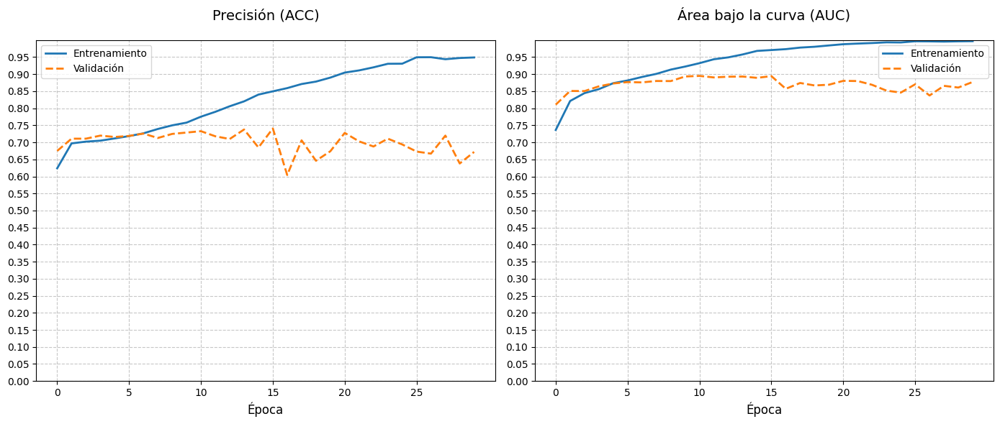

In [10]:
def graficar_metricas(train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist):
    plt.figure(figsize=(14, 6))

    # Gráfico de ACC
    plt.subplot(1, 2, 1)
    plt.plot(train_acc_hist, label='Entrenamiento', linewidth=2)
    plt.plot(val_acc_hist, label='Validación', linestyle='--', linewidth=2)
    plt.xlabel('Época', fontsize=12)
    plt.ylim(0, 1)
    plt.xticks(np.arange(0, len(train_acc_hist), 5))
    plt.yticks(np.arange(0, 1, 0.05))
    plt.grid(True, which='both', linestyle='--', alpha=0.7)
    plt.title('Precisión (ACC)', fontsize=14, pad=20)
    plt.legend()

    # Gráfico de AUC
    plt.subplot(1, 2, 2)
    plt.plot(train_auc_hist, label='Entrenamiento', linewidth=2)
    plt.plot(val_auc_hist, label='Validación', linestyle='--', linewidth=2)
    plt.xlabel('Época', fontsize=12)
    plt.ylim(0, 1)
    plt.xticks(np.arange(0, len(train_auc_hist), 5))  # Etiquetas cada 5 épocas
    plt.yticks(np.arange(0, 1, 0.05)) # Etiquetas cada 5%
    plt.grid(True, which='both', linestyle='--', alpha=0.7)
    plt.title('Área bajo la curva (AUC)', fontsize=14, pad=20)
    plt.legend()

    plt.tight_layout()
    plt.show()

graficar_metricas(train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist)

Limpiar memoria

In [11]:
def liberar_memoria_gpu():
    mem_libre_antes = torch.cuda.mem_get_info()[0]/1024**3

    # Eliminar modelo
    global model  # Si el modelo fue declarado como global
    if 'model' in globals():
        del model

    # Limpiar la caché de CUDA
    torch.cuda.empty_cache()

    # Forzar recolección de basura
    gc.collect()

    # Verificar memoria libre
    mem_libre_ahora = torch.cuda.mem_get_info()[0]/1024**3
    print(f"Memoria libre antes de liberar: {mem_libre_antes:.2f} GB")
    print(f"Memoria libre despues de liberar: {mem_libre_ahora:.2f} GB")
    print(f"Memoria liberada: {(mem_libre_ahora - mem_libre_antes):.2f} GB")

liberar_memoria_gpu()

Memoria libre antes de liberar: 27.30 GB
Memoria libre despues de liberar: 29.76 GB
Memoria liberada: 2.46 GB


---

# 2. MLP Data-Augmentation

> - Train -> ACC=  AUC=  
> - Val ----> ACC=  AUC=  
> - Test --> ACC=  AUC=  

Layers:

\begin{array}{c}
\text{input_size} \\
\downarrow \\
\mathrm{FC}_{\text{4096}} \rightarrow \text{BatchNorm} \rightarrow \text{ReLU}\\
\downarrow \\
\mathrm{FC}_{\text{1024}} \rightarrow \text{BatchNorm} \rightarrow \text{ReLU}\\
\downarrow \\
\mathrm{FC}_{\text{256}} \rightarrow \text{BatchNorm} \rightarrow \text{ReLU}\\
\downarrow \\
\mathrm{FC}_{\text{num_classes}}
\end{array}

Arquitectura del modelo

In [12]:
# Verificar dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Volver a inicializar modelo
model = MLP(input_size, num_classes).to(device)

# Función de pérdida y optimizador
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

Entrenamiento del modelo con validacion

In [13]:
train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist = entrenar_modelo(
    model,
    trainAUG_loader,
    val_loader,
    criterion,
    optimizer,
    num_epochs,
    device
)

Época 1/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.36batch/s, precisión_lote=0.692]



RESUMEN ÉPOCA 1/30:
Entrenamiento - ACC: 0.6432 | AUC: 0.7461
Validación    - ACC: 0.6919 | AUC: 0.8005



Época 2/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.65batch/s, precisión_lote=0.697]



RESUMEN ÉPOCA 2/30:
Entrenamiento - ACC: 0.6940 | AUC: 0.8266
Validación    - ACC: 0.6969 | AUC: 0.8486



Época 3/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.53batch/s, precisión_lote=0.708]



RESUMEN ÉPOCA 3/30:
Entrenamiento - ACC: 0.6962 | AUC: 0.8355
Validación    - ACC: 0.7079 | AUC: 0.8531



Época 4/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.66batch/s, precisión_lote=0.709]



RESUMEN ÉPOCA 4/30:
Entrenamiento - ACC: 0.6992 | AUC: 0.8427
Validación    - ACC: 0.7089 | AUC: 0.8592



Época 5/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.49batch/s, precisión_lote=0.706]



RESUMEN ÉPOCA 5/30:
Entrenamiento - ACC: 0.7117 | AUC: 0.8579
Validación    - ACC: 0.7059 | AUC: 0.8530



Época 6/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.61batch/s, precisión_lote=0.701]



RESUMEN ÉPOCA 6/30:
Entrenamiento - ACC: 0.7077 | AUC: 0.8646
Validación    - ACC: 0.7009 | AUC: 0.8631



Época 7/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.49batch/s, precisión_lote=0.730]



RESUMEN ÉPOCA 7/30:
Entrenamiento - ACC: 0.7169 | AUC: 0.8765
Validación    - ACC: 0.7298 | AUC: 0.8709



Época 8/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.28batch/s, precisión_lote=0.727]



RESUMEN ÉPOCA 8/30:
Entrenamiento - ACC: 0.7176 | AUC: 0.8823
Validación    - ACC: 0.7268 | AUC: 0.8709



Época 9/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.60batch/s, precisión_lote=0.717]



RESUMEN ÉPOCA 9/30:
Entrenamiento - ACC: 0.7184 | AUC: 0.8840
Validación    - ACC: 0.7168 | AUC: 0.8830



Época 10/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.63batch/s, precisión_lote=0.734]



RESUMEN ÉPOCA 10/30:
Entrenamiento - ACC: 0.7210 | AUC: 0.8893
Validación    - ACC: 0.7338 | AUC: 0.9018



Época 11/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.64batch/s, precisión_lote=0.715]



RESUMEN ÉPOCA 11/30:
Entrenamiento - ACC: 0.7341 | AUC: 0.9010
Validación    - ACC: 0.7149 | AUC: 0.8977



Época 12/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.63batch/s, precisión_lote=0.738]



RESUMEN ÉPOCA 12/30:
Entrenamiento - ACC: 0.7367 | AUC: 0.9077
Validación    - ACC: 0.7378 | AUC: 0.9008



Época 13/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.65batch/s, precisión_lote=0.747]



RESUMEN ÉPOCA 13/30:
Entrenamiento - ACC: 0.7444 | AUC: 0.9135
Validación    - ACC: 0.7468 | AUC: 0.9078



Época 14/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.63batch/s, precisión_lote=0.741]



RESUMEN ÉPOCA 14/30:
Entrenamiento - ACC: 0.7395 | AUC: 0.9146
Validación    - ACC: 0.7408 | AUC: 0.9029



Época 15/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.60batch/s, precisión_lote=0.724]



RESUMEN ÉPOCA 15/30:
Entrenamiento - ACC: 0.7473 | AUC: 0.9207
Validación    - ACC: 0.7238 | AUC: 0.9018



Época 16/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.54batch/s, precisión_lote=0.730]



RESUMEN ÉPOCA 16/30:
Entrenamiento - ACC: 0.7518 | AUC: 0.9250
Validación    - ACC: 0.7298 | AUC: 0.8906



Época 17/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.57batch/s, precisión_lote=0.706]



RESUMEN ÉPOCA 17/30:
Entrenamiento - ACC: 0.7570 | AUC: 0.9258
Validación    - ACC: 0.7059 | AUC: 0.8945



Época 18/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.59batch/s, precisión_lote=0.744]



RESUMEN ÉPOCA 18/30:
Entrenamiento - ACC: 0.7541 | AUC: 0.9283
Validación    - ACC: 0.7438 | AUC: 0.9114



Época 19/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.19batch/s, precisión_lote=0.728]



RESUMEN ÉPOCA 19/30:
Entrenamiento - ACC: 0.7587 | AUC: 0.9267
Validación    - ACC: 0.7278 | AUC: 0.9119



Época 20/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.57batch/s, precisión_lote=0.726]



RESUMEN ÉPOCA 20/30:
Entrenamiento - ACC: 0.7615 | AUC: 0.9330
Validación    - ACC: 0.7258 | AUC: 0.9051



Época 21/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.63batch/s, precisión_lote=0.747]



RESUMEN ÉPOCA 21/30:
Entrenamiento - ACC: 0.7679 | AUC: 0.9361
Validación    - ACC: 0.7468 | AUC: 0.9139



Época 22/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.58batch/s, precisión_lote=0.750]



RESUMEN ÉPOCA 22/30:
Entrenamiento - ACC: 0.7668 | AUC: 0.9383
Validación    - ACC: 0.7498 | AUC: 0.9113



Época 23/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.55batch/s, precisión_lote=0.740]



RESUMEN ÉPOCA 23/30:
Entrenamiento - ACC: 0.7711 | AUC: 0.9418
Validación    - ACC: 0.7398 | AUC: 0.9036



Época 24/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.54batch/s, precisión_lote=0.748]



RESUMEN ÉPOCA 24/30:
Entrenamiento - ACC: 0.7765 | AUC: 0.9427
Validación    - ACC: 0.7478 | AUC: 0.9189



Época 25/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.54batch/s, precisión_lote=0.729]



RESUMEN ÉPOCA 25/30:
Entrenamiento - ACC: 0.7806 | AUC: 0.9438
Validación    - ACC: 0.7288 | AUC: 0.9116



Época 26/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.54batch/s, precisión_lote=0.754]



RESUMEN ÉPOCA 26/30:
Entrenamiento - ACC: 0.7819 | AUC: 0.9469
Validación    - ACC: 0.7537 | AUC: 0.9181



Época 27/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.61batch/s, precisión_lote=0.747]



RESUMEN ÉPOCA 27/30:
Entrenamiento - ACC: 0.7798 | AUC: 0.9475
Validación    - ACC: 0.7468 | AUC: 0.9078



Época 28/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.57batch/s, precisión_lote=0.683]



RESUMEN ÉPOCA 28/30:
Entrenamiento - ACC: 0.7781 | AUC: 0.9464
Validación    - ACC: 0.6830 | AUC: 0.8988



Época 29/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.45batch/s, precisión_lote=0.741]



RESUMEN ÉPOCA 29/30:
Entrenamiento - ACC: 0.7943 | AUC: 0.9517
Validación    - ACC: 0.7408 | AUC: 0.9077



Época 30/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.39batch/s, precisión_lote=0.763]


RESUMEN ÉPOCA 30/30:
Entrenamiento - ACC: 0.7905 | AUC: 0.9506
Validación    - ACC: 0.7627 | AUC: 0.9102



Evaluacion conjunto de prueba

In [14]:
evaluar_modelo(model, test_loader, device)


Métricas finales en prueba:
ACC: 0.7357  AUC: 0.9113


Grafica de precision y area bajo la curva

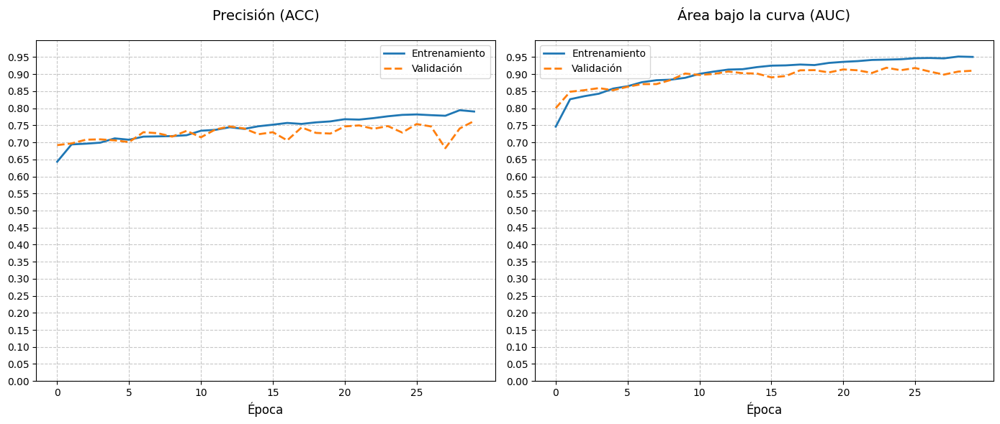

In [15]:
graficar_metricas(train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist)

Limpiar memoria

In [16]:
def liberar_memoria_gpu():
    # Eliminar modelo y mover a CPU (si es necesario)
    global model  # Si el modelo fue declarado como global
    if 'model' in globals():
        del model

    # Limpiar la caché de CUDA
    torch.cuda.empty_cache()

    # Forzar recolección de basura
    gc.collect()

    # Verificar memoria libre (opcional)
    print(f"Memoria libre: {torch.cuda.mem_get_info()[0]/1024**3:.2f} GB")

liberar_memoria_gpu()

Memoria libre: 29.76 GB


---

# 3. MLP con WeightDecay y Dropout para evitar overfitting

> - Train -> ACC=  AUC=  
> - Val ----> ACC=  AUC=  
> - Test --> ACC=  AUC=  

Layers:

\begin{array}{c}
\text{input_size} \\
\downarrow \\
\mathrm{FC}_{\text{4096}} \rightarrow \text{BatchNorm} \rightarrow \text{ReLU} \rightarrow \mathrm{Dropout}_{\text{40%}}\\
\downarrow \\
\mathrm{FC}_{\text{1024}} \rightarrow \text{BatchNorm} \rightarrow \text{ReLU} \rightarrow \mathrm{Dropout}_{\text{30%}}\\
\downarrow \\
\mathrm{FC}_{\text{256}} \rightarrow \text{BatchNorm} \rightarrow \text{ReLU} \rightarrow \mathrm{Dropout}_{\text{20%}}\\
\downarrow \\
\mathrm{FC}_{\text{num_classes}}
\end{array}

Arquitectura del modelo

In [17]:
# Verificar dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Definir la arquitectura MLP con salida softmax
class MLP(nn.Module):
    def __init__(self, input_size, num_classes):
        super(MLP, self).__init__()
        # Capa 1
        self.fc1 = nn.Linear(input_size, 4096)
        self.bn1 = nn.BatchNorm1d(4096)  # BatchNorm
        self.relu1 = nn.ReLU()
        self.dropout1 = nn.Dropout(0.4)  # Dropout 40%

        # Capa 2
        self.fc2 = nn.Linear(4096, 1024)
        self.bn2 = nn.BatchNorm1d(1024)   # BatchNorm
        self.relu2 = nn.ReLU()
        self.dropout2 = nn.Dropout(0.3)   # Dropout 30%

        # Capa 3
        self.fc3 = nn.Linear(1024, 256)
        self.bn3 = nn.BatchNorm1d(256)    # BatchNorm
        self.relu3 = nn.ReLU()
        self.dropout3 = nn.Dropout(0.2)   # Dropout 20%

        # Capa de salida
        self.fc4 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = x.view(x.size(0), -1)  # Aplanar la imagen

        x = self.fc1(x)
        x = self.bn1(x)
        x = self.relu1(x)
        x = self.dropout1(x)

        x = self.fc2(x)
        x = self.bn2(x)
        x = self.relu2(x)
        x = self.dropout2(x)

        x = self.fc3(x)
        x = self.bn3(x)
        x = self.relu3(x)
        x = self.dropout3(x)

        x = self.fc4(x)
        return x

# Inicializar modelo
model = MLP(input_size, num_classes).to(device)

# Función de pérdida y optimizador con weight decay (L2 regularization)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(),
                      lr=learning_rate,
                      weight_decay=weight_decay)  # Regularización L2

Entrenamiento del modelo con validacion

In [18]:
train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist = entrenar_modelo(
    model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    num_epochs,
    device
)

Época 1/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.57batch/s, precisión_lote=0.665]



RESUMEN ÉPOCA 1/30:
Entrenamiento - ACC: 0.6175 | AUC: 0.7376
Validación    - ACC: 0.6650 | AUC: 0.7934



Época 2/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.58batch/s, precisión_lote=0.698]



RESUMEN ÉPOCA 2/30:
Entrenamiento - ACC: 0.6933 | AUC: 0.8191
Validación    - ACC: 0.6979 | AUC: 0.8576



Época 3/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.27batch/s, precisión_lote=0.710]



RESUMEN ÉPOCA 3/30:
Entrenamiento - ACC: 0.6994 | AUC: 0.8275
Validación    - ACC: 0.7099 | AUC: 0.8609



Época 4/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.69batch/s, precisión_lote=0.715]



RESUMEN ÉPOCA 4/30:
Entrenamiento - ACC: 0.7040 | AUC: 0.8420
Validación    - ACC: 0.7149 | AUC: 0.8664



Época 5/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.66batch/s, precisión_lote=0.715]



RESUMEN ÉPOCA 5/30:
Entrenamiento - ACC: 0.7063 | AUC: 0.8527
Validación    - ACC: 0.7149 | AUC: 0.8703



Época 6/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.56batch/s, precisión_lote=0.725]



RESUMEN ÉPOCA 6/30:
Entrenamiento - ACC: 0.7090 | AUC: 0.8604
Validación    - ACC: 0.7248 | AUC: 0.8669



Época 7/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.28batch/s, precisión_lote=0.721]



RESUMEN ÉPOCA 7/30:
Entrenamiento - ACC: 0.7147 | AUC: 0.8717
Validación    - ACC: 0.7208 | AUC: 0.8714



Época 8/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.53batch/s, precisión_lote=0.709]



RESUMEN ÉPOCA 8/30:
Entrenamiento - ACC: 0.7206 | AUC: 0.8793
Validación    - ACC: 0.7089 | AUC: 0.8728



Época 9/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.58batch/s, precisión_lote=0.725]



RESUMEN ÉPOCA 9/30:
Entrenamiento - ACC: 0.7254 | AUC: 0.8887
Validación    - ACC: 0.7248 | AUC: 0.8776



Época 10/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.63batch/s, precisión_lote=0.727]



RESUMEN ÉPOCA 10/30:
Entrenamiento - ACC: 0.7313 | AUC: 0.8932
Validación    - ACC: 0.7268 | AUC: 0.8902



Época 11/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.52batch/s, precisión_lote=0.717]



RESUMEN ÉPOCA 11/30:
Entrenamiento - ACC: 0.7291 | AUC: 0.8997
Validación    - ACC: 0.7168 | AUC: 0.8818



Época 12/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.60batch/s, precisión_lote=0.733]



RESUMEN ÉPOCA 12/30:
Entrenamiento - ACC: 0.7384 | AUC: 0.9008
Validación    - ACC: 0.7328 | AUC: 0.8853



Época 13/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.61batch/s, precisión_lote=0.721]



RESUMEN ÉPOCA 13/30:
Entrenamiento - ACC: 0.7427 | AUC: 0.9064
Validación    - ACC: 0.7208 | AUC: 0.8853



Época 14/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.55batch/s, precisión_lote=0.728]



RESUMEN ÉPOCA 14/30:
Entrenamiento - ACC: 0.7451 | AUC: 0.9142
Validación    - ACC: 0.7278 | AUC: 0.8839



Época 15/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.65batch/s, precisión_lote=0.710]



RESUMEN ÉPOCA 15/30:
Entrenamiento - ACC: 0.7510 | AUC: 0.9176
Validación    - ACC: 0.7099 | AUC: 0.8861



Época 16/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.64batch/s, precisión_lote=0.731]



RESUMEN ÉPOCA 16/30:
Entrenamiento - ACC: 0.7524 | AUC: 0.9175
Validación    - ACC: 0.7308 | AUC: 0.8940



Época 17/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.57batch/s, precisión_lote=0.703]



RESUMEN ÉPOCA 17/30:
Entrenamiento - ACC: 0.7610 | AUC: 0.9231
Validación    - ACC: 0.7029 | AUC: 0.8971



Época 18/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.70batch/s, precisión_lote=0.725]



RESUMEN ÉPOCA 18/30:
Entrenamiento - ACC: 0.7617 | AUC: 0.9243
Validación    - ACC: 0.7248 | AUC: 0.9032



Época 19/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.56batch/s, precisión_lote=0.714]



RESUMEN ÉPOCA 19/30:
Entrenamiento - ACC: 0.7605 | AUC: 0.9257
Validación    - ACC: 0.7139 | AUC: 0.8458



Época 20/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.49batch/s, precisión_lote=0.716]



RESUMEN ÉPOCA 20/30:
Entrenamiento - ACC: 0.7635 | AUC: 0.9252
Validación    - ACC: 0.7159 | AUC: 0.8742



Época 21/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.57batch/s, precisión_lote=0.721]



RESUMEN ÉPOCA 21/30:
Entrenamiento - ACC: 0.7714 | AUC: 0.9308
Validación    - ACC: 0.7208 | AUC: 0.8953



Época 22/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.46batch/s, precisión_lote=0.682]



RESUMEN ÉPOCA 22/30:
Entrenamiento - ACC: 0.7695 | AUC: 0.9282
Validación    - ACC: 0.6820 | AUC: 0.8916



Época 23/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.69batch/s, precisión_lote=0.701]



RESUMEN ÉPOCA 23/30:
Entrenamiento - ACC: 0.7654 | AUC: 0.9299
Validación    - ACC: 0.7009 | AUC: 0.8741



Época 24/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.31batch/s, precisión_lote=0.732]



RESUMEN ÉPOCA 24/30:
Entrenamiento - ACC: 0.7682 | AUC: 0.9264
Validación    - ACC: 0.7318 | AUC: 0.8891



Época 25/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.60batch/s, precisión_lote=0.683]



RESUMEN ÉPOCA 25/30:
Entrenamiento - ACC: 0.7652 | AUC: 0.9291
Validación    - ACC: 0.6830 | AUC: 0.8855



Época 26/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.44batch/s, precisión_lote=0.717]



RESUMEN ÉPOCA 26/30:
Entrenamiento - ACC: 0.7765 | AUC: 0.9332
Validación    - ACC: 0.7168 | AUC: 0.8890



Época 27/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.55batch/s, precisión_lote=0.721]



RESUMEN ÉPOCA 27/30:
Entrenamiento - ACC: 0.7732 | AUC: 0.9349
Validación    - ACC: 0.7208 | AUC: 0.8905



Época 28/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.37batch/s, precisión_lote=0.752]



RESUMEN ÉPOCA 28/30:
Entrenamiento - ACC: 0.7757 | AUC: 0.9358
Validación    - ACC: 0.7517 | AUC: 0.9105



Época 29/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.49batch/s, precisión_lote=0.713]



RESUMEN ÉPOCA 29/30:
Entrenamiento - ACC: 0.7761 | AUC: 0.9361
Validación    - ACC: 0.7129 | AUC: 0.8708



Época 30/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.55batch/s, precisión_lote=0.738]


RESUMEN ÉPOCA 30/30:
Entrenamiento - ACC: 0.7728 | AUC: 0.9341
Validación    - ACC: 0.7378 | AUC: 0.9057



Evaluacion conjunto de prueba

In [19]:
evaluar_modelo(model, test_loader, device)


Métricas finales en prueba:
ACC: 0.7237  AUC: 0.8907


Grafica de precision y area bajo la curva

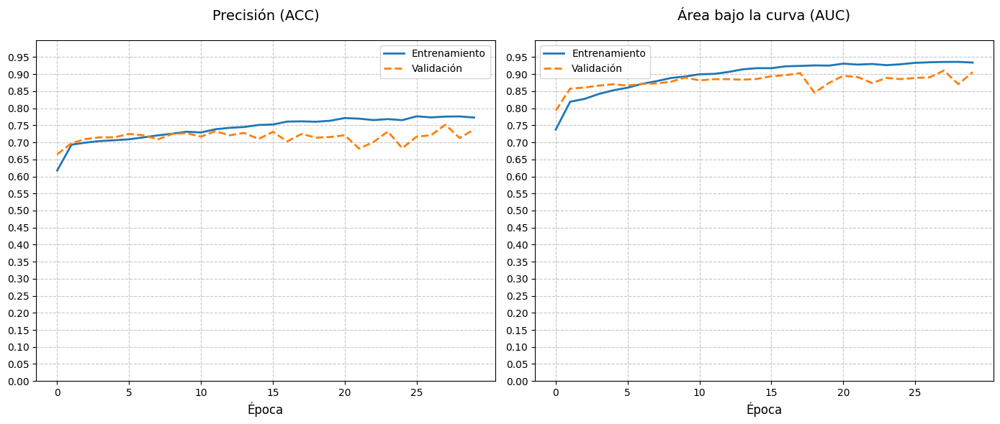

In [20]:
graficar_metricas(train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist)

Limpiar memoria

In [21]:
liberar_memoria_gpu()

Memoria libre: 29.75 GB


---

# 4. MLP Data-Augmentation con WeightDecay y Dropout para evitar overfitting

> - Train -> ACC=  AUC=  
> - Val ----> ACC=  AUC=  
> - Test --> ACC=  AUC=  

Layers:

\begin{array}{c}
\text{input_size} \\
\downarrow \\
\mathrm{FC}_{\text{4096}} \rightarrow \text{BatchNorm} \rightarrow \text{ReLU} \rightarrow \mathrm{Dropout}_{\text{40%}}\\
\downarrow \\
\mathrm{FC}_{\text{1024}} \rightarrow \text{BatchNorm} \rightarrow \text{ReLU} \rightarrow \mathrm{Dropout}_{\text{30%}}\\
\downarrow \\
\mathrm{FC}_{\text{256}} \rightarrow \text{BatchNorm} \rightarrow \text{ReLU} \rightarrow \mathrm{Dropout}_{\text{20%}}\\
\downarrow \\
\mathrm{FC}_{\text{num_classes}}
\end{array}

Arquitectura del modelo

In [22]:
# Verificar dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Volver a inicializar modelo
model = MLP(input_size, num_classes).to(device)

# Función de pérdida y optimizador con weight decay (L2 regularization)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(),
                      lr=learning_rate,
                      weight_decay=weight_decay)  # Regularización L2

Entrenamiento del modelo con validacion

In [23]:
train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist = entrenar_modelo(
    model,
    trainAUG_loader,
    val_loader,
    criterion,
    optimizer,
    num_epochs,
    device
)

Época 1/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.59batch/s, precisión_lote=0.696]



RESUMEN ÉPOCA 1/30:
Entrenamiento - ACC: 0.6144 | AUC: 0.7182
Validación    - ACC: 0.6959 | AUC: 0.7906



Época 2/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.36batch/s, precisión_lote=0.700]



RESUMEN ÉPOCA 2/30:
Entrenamiento - ACC: 0.6905 | AUC: 0.8078
Validación    - ACC: 0.6999 | AUC: 0.8520



Época 3/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.62batch/s, precisión_lote=0.714]



RESUMEN ÉPOCA 3/30:
Entrenamiento - ACC: 0.6930 | AUC: 0.8314
Validación    - ACC: 0.7139 | AUC: 0.8614



Época 4/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.63batch/s, precisión_lote=0.700]



RESUMEN ÉPOCA 4/30:
Entrenamiento - ACC: 0.6930 | AUC: 0.8334
Validación    - ACC: 0.6999 | AUC: 0.8648



Época 5/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.65batch/s, precisión_lote=0.704]



RESUMEN ÉPOCA 5/30:
Entrenamiento - ACC: 0.7003 | AUC: 0.8388
Validación    - ACC: 0.7039 | AUC: 0.8632



Época 6/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.62batch/s, precisión_lote=0.720]



RESUMEN ÉPOCA 6/30:
Entrenamiento - ACC: 0.7036 | AUC: 0.8500
Validación    - ACC: 0.7198 | AUC: 0.8685



Época 7/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.15batch/s, precisión_lote=0.712]



RESUMEN ÉPOCA 7/30:
Entrenamiento - ACC: 0.7033 | AUC: 0.8547
Validación    - ACC: 0.7119 | AUC: 0.8652



Época 8/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.65batch/s, precisión_lote=0.721]



RESUMEN ÉPOCA 8/30:
Entrenamiento - ACC: 0.7096 | AUC: 0.8626
Validación    - ACC: 0.7208 | AUC: 0.8766



Época 9/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.66batch/s, precisión_lote=0.726]



RESUMEN ÉPOCA 9/30:
Entrenamiento - ACC: 0.7080 | AUC: 0.8659
Validación    - ACC: 0.7258 | AUC: 0.8775



Época 10/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.61batch/s, precisión_lote=0.726]



RESUMEN ÉPOCA 10/30:
Entrenamiento - ACC: 0.7063 | AUC: 0.8684
Validación    - ACC: 0.7258 | AUC: 0.8802



Época 11/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.65batch/s, precisión_lote=0.714]



RESUMEN ÉPOCA 11/30:
Entrenamiento - ACC: 0.7140 | AUC: 0.8781
Validación    - ACC: 0.7139 | AUC: 0.8801



Época 12/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.16batch/s, precisión_lote=0.705]



RESUMEN ÉPOCA 12/30:
Entrenamiento - ACC: 0.7094 | AUC: 0.8808
Validación    - ACC: 0.7049 | AUC: 0.8771



Época 13/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.56batch/s, precisión_lote=0.729]



RESUMEN ÉPOCA 13/30:
Entrenamiento - ACC: 0.7156 | AUC: 0.8767
Validación    - ACC: 0.7288 | AUC: 0.8956



Época 14/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.53batch/s, precisión_lote=0.733]



RESUMEN ÉPOCA 14/30:
Entrenamiento - ACC: 0.7171 | AUC: 0.8877
Validación    - ACC: 0.7328 | AUC: 0.9025



Época 15/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.30batch/s, precisión_lote=0.714]



RESUMEN ÉPOCA 15/30:
Entrenamiento - ACC: 0.7201 | AUC: 0.8897
Validación    - ACC: 0.7139 | AUC: 0.8975



Época 16/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.64batch/s, precisión_lote=0.708]



RESUMEN ÉPOCA 16/30:
Entrenamiento - ACC: 0.7287 | AUC: 0.8994
Validación    - ACC: 0.7079 | AUC: 0.8917



Época 17/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.62batch/s, precisión_lote=0.725]



RESUMEN ÉPOCA 17/30:
Entrenamiento - ACC: 0.7216 | AUC: 0.8986
Validación    - ACC: 0.7248 | AUC: 0.8969



Época 18/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.50batch/s, precisión_lote=0.725]



RESUMEN ÉPOCA 18/30:
Entrenamiento - ACC: 0.7257 | AUC: 0.8968
Validación    - ACC: 0.7248 | AUC: 0.8997



Época 19/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.54batch/s, precisión_lote=0.729]



RESUMEN ÉPOCA 19/30:
Entrenamiento - ACC: 0.7276 | AUC: 0.8981
Validación    - ACC: 0.7288 | AUC: 0.8913



Época 20/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.43batch/s, precisión_lote=0.721]



RESUMEN ÉPOCA 20/30:
Entrenamiento - ACC: 0.7251 | AUC: 0.8979
Validación    - ACC: 0.7208 | AUC: 0.8918



Época 21/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.59batch/s, precisión_lote=0.701]



RESUMEN ÉPOCA 21/30:
Entrenamiento - ACC: 0.7280 | AUC: 0.9007
Validación    - ACC: 0.7009 | AUC: 0.8609



Época 22/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.49batch/s, precisión_lote=0.716]



RESUMEN ÉPOCA 22/30:
Entrenamiento - ACC: 0.7308 | AUC: 0.8997
Validación    - ACC: 0.7159 | AUC: 0.9067



Época 23/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.62batch/s, precisión_lote=0.723]



RESUMEN ÉPOCA 23/30:
Entrenamiento - ACC: 0.7330 | AUC: 0.9067
Validación    - ACC: 0.7228 | AUC: 0.8909



Época 24/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.56batch/s, precisión_lote=0.722]



RESUMEN ÉPOCA 24/30:
Entrenamiento - ACC: 0.7288 | AUC: 0.9026
Validación    - ACC: 0.7218 | AUC: 0.8958



Época 25/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.39batch/s, precisión_lote=0.725]



RESUMEN ÉPOCA 25/30:
Entrenamiento - ACC: 0.7291 | AUC: 0.9012
Validación    - ACC: 0.7248 | AUC: 0.8945



Época 26/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.58batch/s, precisión_lote=0.727]



RESUMEN ÉPOCA 26/30:
Entrenamiento - ACC: 0.7340 | AUC: 0.9033
Validación    - ACC: 0.7268 | AUC: 0.9015



Época 27/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.61batch/s, precisión_lote=0.721]



RESUMEN ÉPOCA 27/30:
Entrenamiento - ACC: 0.7344 | AUC: 0.9055
Validación    - ACC: 0.7208 | AUC: 0.9079



Época 28/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.52batch/s, precisión_lote=0.730]



RESUMEN ÉPOCA 28/30:
Entrenamiento - ACC: 0.7356 | AUC: 0.9095
Validación    - ACC: 0.7298 | AUC: 0.9060



Época 29/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.50batch/s, precisión_lote=0.731]



RESUMEN ÉPOCA 29/30:
Entrenamiento - ACC: 0.7380 | AUC: 0.9058
Validación    - ACC: 0.7308 | AUC: 0.9080



Época 30/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.26batch/s, precisión_lote=0.733]


RESUMEN ÉPOCA 30/30:
Entrenamiento - ACC: 0.7320 | AUC: 0.9082
Validación    - ACC: 0.7328 | AUC: 0.9034



Evaluacion conjunto de prueba

In [24]:
evaluar_modelo(model, test_loader, device)


Métricas finales en prueba:
ACC: 0.7167  AUC: 0.8892


Grafica de precision y area bajo la curva

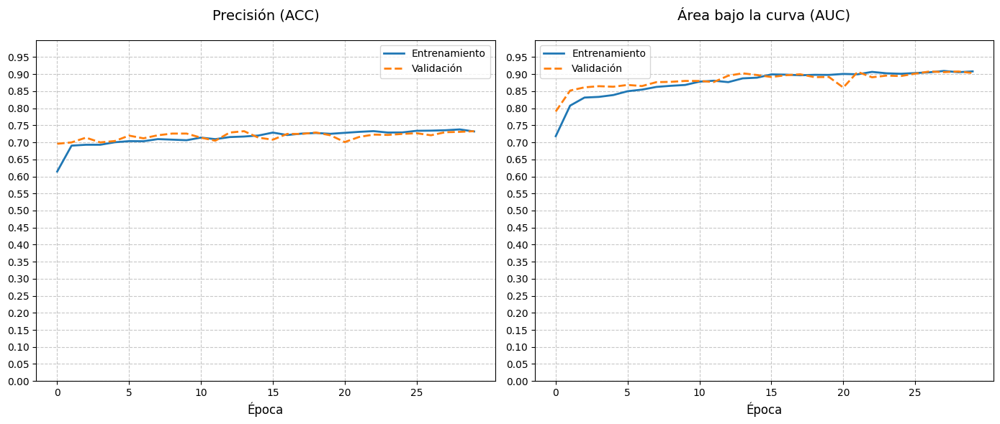

In [25]:
graficar_metricas(train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist)

Limpiar memoria

In [26]:
liberar_memoria_gpu()

Memoria libre: 29.76 GB


---

# 5. CNN con WeightDecay y Dropout para evitar overfitting

> - Train -> ACC=  AUC=  
> - Val ----> ACC=  AUC=  
> - Test --> ACC=  AUC=  

Layers where kernel_size(k), padding(p) and stride(s):

\begin{array}{c}
\text{input_size} \\
\downarrow \\
\mathrm{Conv2D}_{\text{in:3 out:64 k:3 p:1}} \rightarrow \text{BatchNorm2D} \rightarrow \text{ReLU} \rightarrow \mathrm{MaxPool2D}_{\text{k:2 s:2}} \rightarrow \mathrm{Dropout}_{\text{20%}}\\
\downarrow \\
\mathrm{Conv2D}_{\text{in:64 out:128 k:3 p:1}} \rightarrow \text{BatchNorm2D} \rightarrow \text{ReLU} \rightarrow \mathrm{MaxPool2D}_{\text{k:2 s:2}} \rightarrow \mathrm{Dropout}_{\text{30%}}\\
\downarrow \\
\mathrm{Conv2D}_{\text{in:128 out:256 k:3 p:1}} \rightarrow \text{BatchNorm2D} \rightarrow \text{ReLU} \rightarrow \mathrm{MaxPool2D}_{\text{k:2 s:2}} \rightarrow \mathrm{Dropout}_{\text{40%}}\\
\downarrow \\
\mathrm{Conv2D}_{\text{in:256 out:512 k:3 p:1}} \rightarrow \text{BatchNorm2D} \rightarrow \text{ReLU} \rightarrow \mathrm{MaxPool2D}_{\text{k:2 s:2}} \rightarrow \mathrm{Dropout}_{\text{50%}}\\
\downarrow \\
\mathrm{AdapAvgPool2D}_{\text{out:7x7}} \rightarrow \text{Flatten} \rightarrow \mathrm{FC}_{\text{1024}} \rightarrow \text{BatchNorm} \rightarrow \text{ReLU} \rightarrow \mathrm{Dropout}_{\text{50%}}\\
\downarrow \\
\mathrm{FC}_{\text{256}} \rightarrow \text{BatchNorm} \rightarrow \text{ReLU} \rightarrow \mathrm{Dropout}_{\text{30%}}\\
\downarrow \\
\mathrm{FC}_{\text{num_classes}}
\end{array}

Arquitectura del modelo

In [27]:
# Verificar dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Definir arquitectura CNN
class CNN(nn.Module):
    def __init__(self, input_size, num_classes):
        super(CNN, self).__init__()

        # Capas convolucionales
        self.conv_layers = nn.Sequential(
            # Bloque 1: 224x224 -> 112x112
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2), # Kernel 2x2 y stride 2 para reducir a la mitad
            nn.Dropout2d(0.2),

            # Bloque 2: 112x112 -> 56x56
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
            nn.Dropout2d(0.3),

            # Bloque 3: 56x56 -> 28x28
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
            nn.Dropout2d(0.4),

            # Bloque 4: 28x28 -> 14x14
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
            nn.Dropout2d(0.5)
        )

        # Capas totalmente conectadas
        self.fc_layers = nn.Sequential(
            nn.AdaptiveAvgPool2d((7, 7)),  # Reducción a tamaño fijo
            nn.Flatten(),
            nn.Linear(512*7*7, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(),
            nn.Dropout(0.5),

            nn.Linear(1024, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = self.fc_layers(x)
        return x

# Inicializar modelo
model = CNN(input_size, num_classes).to(device)

# Función de pérdida y optimizador con regularización
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(),
                      lr=learning_rate,
                      weight_decay=weight_decay)  # L2 regularization

Entrenamiento del modelo con validacion

In [28]:
train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist = entrenar_modelo(
    model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    num_epochs,
    device
)

Época 1/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.50batch/s, precisión_lote=0.686]



RESUMEN ÉPOCA 1/30:
Entrenamiento - ACC: 0.6031 | AUC: 0.7005
Validación    - ACC: 0.6859 | AUC: 0.8334



Época 2/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.95batch/s, precisión_lote=0.709]



RESUMEN ÉPOCA 2/30:
Entrenamiento - ACC: 0.6882 | AUC: 0.8244
Validación    - ACC: 0.7089 | AUC: 0.8787



Época 3/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.08batch/s, precisión_lote=0.725]



RESUMEN ÉPOCA 3/30:
Entrenamiento - ACC: 0.6997 | AUC: 0.8478
Validación    - ACC: 0.7248 | AUC: 0.8989



Época 4/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.05batch/s, precisión_lote=0.726]



RESUMEN ÉPOCA 4/30:
Entrenamiento - ACC: 0.7062 | AUC: 0.8625
Validación    - ACC: 0.7258 | AUC: 0.9072



Época 5/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.04batch/s, precisión_lote=0.722]



RESUMEN ÉPOCA 5/30:
Entrenamiento - ACC: 0.7033 | AUC: 0.8747
Validación    - ACC: 0.7218 | AUC: 0.9119



Época 6/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.05batch/s, precisión_lote=0.731]



RESUMEN ÉPOCA 6/30:
Entrenamiento - ACC: 0.7101 | AUC: 0.8831
Validación    - ACC: 0.7308 | AUC: 0.9145



Época 7/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.05batch/s, precisión_lote=0.746]



RESUMEN ÉPOCA 7/30:
Entrenamiento - ACC: 0.7210 | AUC: 0.8845
Validación    - ACC: 0.7458 | AUC: 0.9212



Época 8/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.49batch/s, precisión_lote=0.751]



RESUMEN ÉPOCA 8/30:
Entrenamiento - ACC: 0.7260 | AUC: 0.8960
Validación    - ACC: 0.7507 | AUC: 0.9186



Época 9/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  4.00batch/s, precisión_lote=0.751]



RESUMEN ÉPOCA 9/30:
Entrenamiento - ACC: 0.7321 | AUC: 0.8893
Validación    - ACC: 0.7507 | AUC: 0.9227



Época 10/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.06batch/s, precisión_lote=0.745]



RESUMEN ÉPOCA 10/30:
Entrenamiento - ACC: 0.7280 | AUC: 0.8952
Validación    - ACC: 0.7448 | AUC: 0.9221



Época 11/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.01batch/s, precisión_lote=0.760]



RESUMEN ÉPOCA 11/30:
Entrenamiento - ACC: 0.7311 | AUC: 0.8971
Validación    - ACC: 0.7597 | AUC: 0.9236



Época 12/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.01batch/s, precisión_lote=0.764]



RESUMEN ÉPOCA 12/30:
Entrenamiento - ACC: 0.7320 | AUC: 0.9057
Validación    - ACC: 0.7637 | AUC: 0.9321



Época 13/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.12batch/s, precisión_lote=0.767]



RESUMEN ÉPOCA 13/30:
Entrenamiento - ACC: 0.7364 | AUC: 0.9069
Validación    - ACC: 0.7667 | AUC: 0.9307



Época 14/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.06batch/s, precisión_lote=0.767]



RESUMEN ÉPOCA 14/30:
Entrenamiento - ACC: 0.7380 | AUC: 0.9097
Validación    - ACC: 0.7667 | AUC: 0.9293



Época 15/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.05batch/s, precisión_lote=0.759]



RESUMEN ÉPOCA 15/30:
Entrenamiento - ACC: 0.7418 | AUC: 0.9116
Validación    - ACC: 0.7587 | AUC: 0.9241



Época 16/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.00batch/s, precisión_lote=0.764]



RESUMEN ÉPOCA 16/30:
Entrenamiento - ACC: 0.7483 | AUC: 0.9115
Validación    - ACC: 0.7637 | AUC: 0.9282



Época 17/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.02batch/s, precisión_lote=0.763]



RESUMEN ÉPOCA 17/30:
Entrenamiento - ACC: 0.7491 | AUC: 0.9142
Validación    - ACC: 0.7627 | AUC: 0.9305



Época 18/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.80batch/s, precisión_lote=0.768]



RESUMEN ÉPOCA 18/30:
Entrenamiento - ACC: 0.7527 | AUC: 0.9163
Validación    - ACC: 0.7677 | AUC: 0.9296



Época 19/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.89batch/s, precisión_lote=0.756]



RESUMEN ÉPOCA 19/30:
Entrenamiento - ACC: 0.7548 | AUC: 0.9173
Validación    - ACC: 0.7557 | AUC: 0.9311



Época 20/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.99batch/s, precisión_lote=0.765]



RESUMEN ÉPOCA 20/30:
Entrenamiento - ACC: 0.7488 | AUC: 0.9202
Validación    - ACC: 0.7647 | AUC: 0.9317



Época 21/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.04batch/s, precisión_lote=0.770]



RESUMEN ÉPOCA 21/30:
Entrenamiento - ACC: 0.7541 | AUC: 0.9231
Validación    - ACC: 0.7697 | AUC: 0.9320



Época 22/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.06batch/s, precisión_lote=0.777]



RESUMEN ÉPOCA 22/30:
Entrenamiento - ACC: 0.7585 | AUC: 0.9231
Validación    - ACC: 0.7767 | AUC: 0.9350



Época 23/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.01batch/s, precisión_lote=0.781]



RESUMEN ÉPOCA 23/30:
Entrenamiento - ACC: 0.7591 | AUC: 0.9262
Validación    - ACC: 0.7807 | AUC: 0.9374



Época 24/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.05batch/s, precisión_lote=0.779]



RESUMEN ÉPOCA 24/30:
Entrenamiento - ACC: 0.7611 | AUC: 0.9263
Validación    - ACC: 0.7787 | AUC: 0.9334



Época 25/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.97batch/s, precisión_lote=0.771]



RESUMEN ÉPOCA 25/30:
Entrenamiento - ACC: 0.7659 | AUC: 0.9260
Validación    - ACC: 0.7707 | AUC: 0.9329



Época 26/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.10batch/s, precisión_lote=0.779]



RESUMEN ÉPOCA 26/30:
Entrenamiento - ACC: 0.7687 | AUC: 0.9283
Validación    - ACC: 0.7787 | AUC: 0.9321



Época 27/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.11batch/s, precisión_lote=0.780]



RESUMEN ÉPOCA 27/30:
Entrenamiento - ACC: 0.7621 | AUC: 0.9301
Validación    - ACC: 0.7797 | AUC: 0.9339



Época 28/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.03batch/s, precisión_lote=0.783]



RESUMEN ÉPOCA 28/30:
Entrenamiento - ACC: 0.7731 | AUC: 0.9344
Validación    - ACC: 0.7827 | AUC: 0.9344



Época 29/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.95batch/s, precisión_lote=0.776]



RESUMEN ÉPOCA 29/30:
Entrenamiento - ACC: 0.7705 | AUC: 0.9328
Validación    - ACC: 0.7757 | AUC: 0.9362



Época 30/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.64batch/s, precisión_lote=0.781]


RESUMEN ÉPOCA 30/30:
Entrenamiento - ACC: 0.7748 | AUC: 0.9361
Validación    - ACC: 0.7807 | AUC: 0.9330



Evaluacion conjunto de prueba

In [29]:
evaluar_modelo(model, test_loader, device)


Métricas finales en prueba:
ACC: 0.7716  AUC: 0.9324


Grafica de precision y area bajo la curva

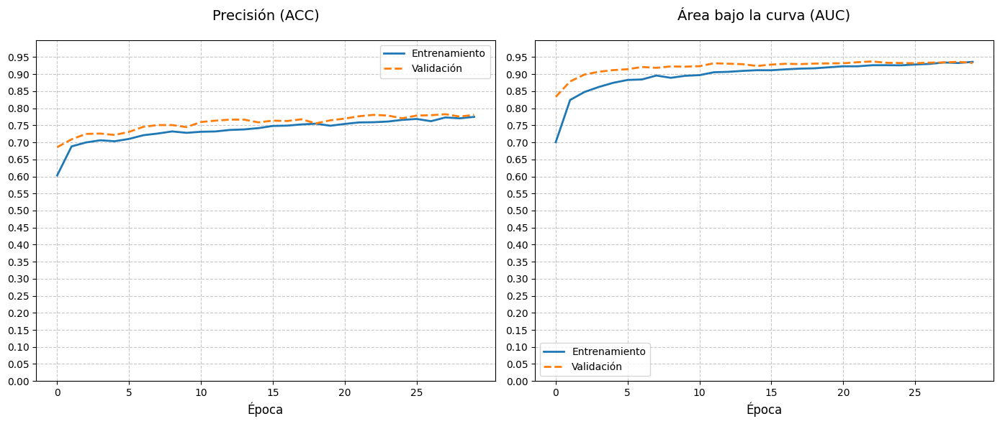

In [30]:
graficar_metricas(train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist)

Limpiar memoria

In [31]:
liberar_memoria_gpu()

Memoria libre: 36.59 GB


---

# 6. CNN Data-Augmentation con WeightDecay y Dropout para evitar overfitting

> - Train -> ACC=  AUC=  
> - Val ----> ACC=  AUC=  
> - Test --> ACC=  AUC=  

Layers where kernel_size(k), padding(p) and stride(s):

\begin{array}{c}
\text{input_size} \\
\downarrow \\
\mathrm{Conv2D}_{\text{in:3 out:64 k:3 p:1}} \rightarrow \text{BatchNorm2D} \rightarrow \text{ReLU} \rightarrow \mathrm{MaxPool2D}_{\text{k:2 s:2}} \rightarrow \mathrm{Dropout}_{\text{20%}}\\
\downarrow \\
\mathrm{Conv2D}_{\text{in:64 out:128 k:3 p:1}} \rightarrow \text{BatchNorm2D} \rightarrow \text{ReLU} \rightarrow \mathrm{MaxPool2D}_{\text{k:2 s:2}} \rightarrow \mathrm{Dropout}_{\text{30%}}\\
\downarrow \\
\mathrm{Conv2D}_{\text{in:128 out:256 k:3 p:1}} \rightarrow \text{BatchNorm2D} \rightarrow \text{ReLU} \rightarrow \mathrm{MaxPool2D}_{\text{k:2 s:2}} \rightarrow \mathrm{Dropout}_{\text{40%}}\\
\downarrow \\
\mathrm{Conv2D}_{\text{in:256 out:512 k:3 p:1}} \rightarrow \text{BatchNorm2D} \rightarrow \text{ReLU} \rightarrow \mathrm{MaxPool2D}_{\text{k:2 s:2}} \rightarrow \mathrm{Dropout}_{\text{50%}}\\
\downarrow \\
\mathrm{AdapAvgPool2D}_{\text{out:7x7}} \rightarrow \text{Flatten} \rightarrow \mathrm{FC}_{\text{1024}} \rightarrow \text{BatchNorm} \rightarrow \text{ReLU} \rightarrow \mathrm{Dropout}_{\text{50%}}\\
\downarrow \\
\mathrm{FC}_{\text{256}} \rightarrow \text{BatchNorm} \rightarrow \text{ReLU} \rightarrow \mathrm{Dropout}_{\text{30%}}\\
\downarrow \\
\mathrm{FC}_{\text{num_classes}}
\end{array}

Arquitectura del modelo

In [32]:
# Verificar dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Inicializar modelo
model = CNN(input_size, num_classes).to(device)

# Función de pérdida y optimizador con regularización
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(),
                      lr=learning_rate,
                      weight_decay=weight_decay)  # L2 regularization

Entrenamiento del modelo con validacion

In [33]:
train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist = entrenar_modelo(
    model,
    trainAUG_loader,
    val_loader,
    criterion,
    optimizer,
    num_epochs,
    device
)

Época 1/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.81batch/s, precisión_lote=0.697]



RESUMEN ÉPOCA 1/30:
Entrenamiento - ACC: 0.6017 | AUC: 0.6927
Validación    - ACC: 0.6969 | AUC: 0.8520



Época 2/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.01batch/s, precisión_lote=0.703]



RESUMEN ÉPOCA 2/30:
Entrenamiento - ACC: 0.6785 | AUC: 0.8187
Validación    - ACC: 0.7029 | AUC: 0.8812



Época 3/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.05batch/s, precisión_lote=0.711]



RESUMEN ÉPOCA 3/30:
Entrenamiento - ACC: 0.6909 | AUC: 0.8347
Validación    - ACC: 0.7109 | AUC: 0.8903



Época 4/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.99batch/s, precisión_lote=0.725]



RESUMEN ÉPOCA 4/30:
Entrenamiento - ACC: 0.7040 | AUC: 0.8552
Validación    - ACC: 0.7248 | AUC: 0.9005



Época 5/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.89batch/s, precisión_lote=0.732]



RESUMEN ÉPOCA 5/30:
Entrenamiento - ACC: 0.7056 | AUC: 0.8629
Validación    - ACC: 0.7318 | AUC: 0.9082



Época 6/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.93batch/s, precisión_lote=0.726]



RESUMEN ÉPOCA 6/30:
Entrenamiento - ACC: 0.7070 | AUC: 0.8722
Validación    - ACC: 0.7258 | AUC: 0.9136



Época 7/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.98batch/s, precisión_lote=0.744]



RESUMEN ÉPOCA 7/30:
Entrenamiento - ACC: 0.7087 | AUC: 0.8727
Validación    - ACC: 0.7438 | AUC: 0.9177



Época 8/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.94batch/s, precisión_lote=0.732]



RESUMEN ÉPOCA 8/30:
Entrenamiento - ACC: 0.7130 | AUC: 0.8794
Validación    - ACC: 0.7318 | AUC: 0.9160



Época 9/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.96batch/s, precisión_lote=0.746]



RESUMEN ÉPOCA 9/30:
Entrenamiento - ACC: 0.7196 | AUC: 0.8855
Validación    - ACC: 0.7458 | AUC: 0.9194



Época 10/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.90batch/s, precisión_lote=0.753]



RESUMEN ÉPOCA 10/30:
Entrenamiento - ACC: 0.7214 | AUC: 0.8853
Validación    - ACC: 0.7527 | AUC: 0.9243



Época 11/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.01batch/s, precisión_lote=0.749]



RESUMEN ÉPOCA 11/30:
Entrenamiento - ACC: 0.7240 | AUC: 0.8873
Validación    - ACC: 0.7488 | AUC: 0.9212



Época 12/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.84batch/s, precisión_lote=0.772]



RESUMEN ÉPOCA 12/30:
Entrenamiento - ACC: 0.7210 | AUC: 0.8918
Validación    - ACC: 0.7717 | AUC: 0.9236



Época 13/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.05batch/s, precisión_lote=0.765]



RESUMEN ÉPOCA 13/30:
Entrenamiento - ACC: 0.7268 | AUC: 0.8967
Validación    - ACC: 0.7647 | AUC: 0.9225



Época 14/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.02batch/s, precisión_lote=0.757]



RESUMEN ÉPOCA 14/30:
Entrenamiento - ACC: 0.7278 | AUC: 0.8927
Validación    - ACC: 0.7567 | AUC: 0.9196



Época 15/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.06batch/s, precisión_lote=0.750]



RESUMEN ÉPOCA 15/30:
Entrenamiento - ACC: 0.7303 | AUC: 0.8988
Validación    - ACC: 0.7498 | AUC: 0.9232



Época 16/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.70batch/s, precisión_lote=0.761]



RESUMEN ÉPOCA 16/30:
Entrenamiento - ACC: 0.7320 | AUC: 0.9001
Validación    - ACC: 0.7607 | AUC: 0.9262



Época 17/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.96batch/s, precisión_lote=0.758]



RESUMEN ÉPOCA 17/30:
Entrenamiento - ACC: 0.7293 | AUC: 0.9001
Validación    - ACC: 0.7577 | AUC: 0.9271



Época 18/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.04batch/s, precisión_lote=0.760]



RESUMEN ÉPOCA 18/30:
Entrenamiento - ACC: 0.7336 | AUC: 0.9021
Validación    - ACC: 0.7597 | AUC: 0.9210



Época 19/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.97batch/s, precisión_lote=0.769]



RESUMEN ÉPOCA 19/30:
Entrenamiento - ACC: 0.7348 | AUC: 0.9016
Validación    - ACC: 0.7687 | AUC: 0.9302



Época 20/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.84batch/s, precisión_lote=0.767]



RESUMEN ÉPOCA 20/30:
Entrenamiento - ACC: 0.7340 | AUC: 0.9013
Validación    - ACC: 0.7667 | AUC: 0.9289



Época 21/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.00batch/s, precisión_lote=0.776]



RESUMEN ÉPOCA 21/30:
Entrenamiento - ACC: 0.7430 | AUC: 0.9050
Validación    - ACC: 0.7757 | AUC: 0.9305



Época 22/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.05batch/s, precisión_lote=0.764]



RESUMEN ÉPOCA 22/30:
Entrenamiento - ACC: 0.7428 | AUC: 0.9062
Validación    - ACC: 0.7637 | AUC: 0.9281



Época 23/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  4.00batch/s, precisión_lote=0.765]



RESUMEN ÉPOCA 23/30:
Entrenamiento - ACC: 0.7398 | AUC: 0.9057
Validación    - ACC: 0.7647 | AUC: 0.9276



Época 24/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.94batch/s, precisión_lote=0.772]



RESUMEN ÉPOCA 24/30:
Entrenamiento - ACC: 0.7415 | AUC: 0.9072
Validación    - ACC: 0.7717 | AUC: 0.9247



Época 25/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  4.00batch/s, precisión_lote=0.779]



RESUMEN ÉPOCA 25/30:
Entrenamiento - ACC: 0.7383 | AUC: 0.9088
Validación    - ACC: 0.7787 | AUC: 0.9321



Época 26/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.05batch/s, precisión_lote=0.774]



RESUMEN ÉPOCA 26/30:
Entrenamiento - ACC: 0.7393 | AUC: 0.9082
Validación    - ACC: 0.7737 | AUC: 0.9256



Época 27/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.97batch/s, precisión_lote=0.772]



RESUMEN ÉPOCA 27/30:
Entrenamiento - ACC: 0.7471 | AUC: 0.9112
Validación    - ACC: 0.7717 | AUC: 0.9295



Época 28/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.02batch/s, precisión_lote=0.772]



RESUMEN ÉPOCA 28/30:
Entrenamiento - ACC: 0.7461 | AUC: 0.9134
Validación    - ACC: 0.7717 | AUC: 0.9312



Época 29/30 [Validación]: 100%|██████████| 4/4 [00:00<00:00,  4.03batch/s, precisión_lote=0.784]



RESUMEN ÉPOCA 29/30:
Entrenamiento - ACC: 0.7477 | AUC: 0.9129
Validación    - ACC: 0.7836 | AUC: 0.9322



Época 30/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  3.82batch/s, precisión_lote=0.771]


RESUMEN ÉPOCA 30/30:
Entrenamiento - ACC: 0.7433 | AUC: 0.9110
Validación    - ACC: 0.7707 | AUC: 0.9309



Evaluacion conjunto de prueba

In [34]:
evaluar_modelo(model, test_loader, device)


Métricas finales en prueba:
ACC: 0.7631  AUC: 0.9296


Grafica de precision y area bajo la curva

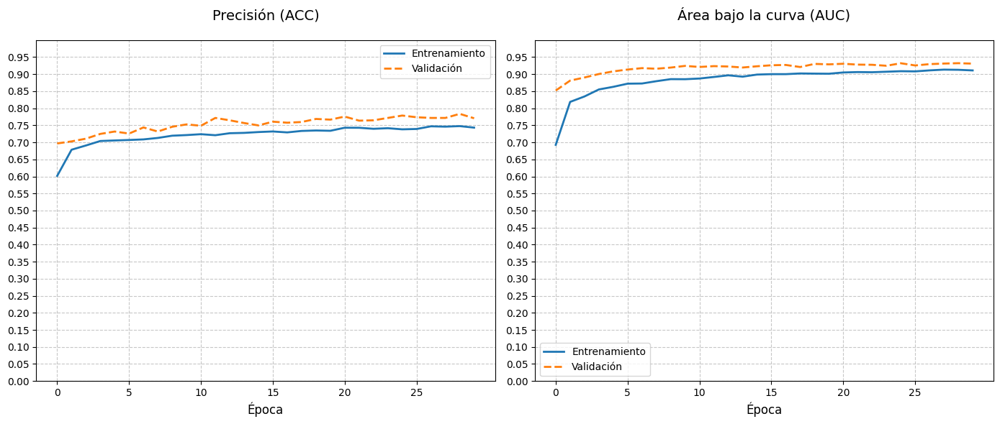

In [35]:
graficar_metricas(train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist)

Limpiar memoria

In [36]:
liberar_memoria_gpu()

Memoria libre: 36.21 GB


---

# 7. ViT

> - Train -> ACC=  AUC=  
> - Val ----> ACC=  AUC=  
> - Test --> ACC=  AUC=  

Layers where kernel_size(k), padding(p) and stride(s):

\begin{array}{l}
\text{Input: 224x224x3} \\
\downarrow \\
\text{Patch Embedding (16x16)} \rightarrow \text{196 patches} \rightarrow \mathrm{Linear_{768}} \\
\downarrow \\
\text{Concat [class\_token]} \rightarrow \text{Add Positional Embeddings} \rightarrow \mathrm{Dropout_{10\%}} \\
\downarrow \\
\begin{array}{|l|}
\hline
\text{Transformer Encoder (x6 layers):} \\
\quad \text{LayerNorm} \rightarrow \mathrm{MultiHeadAttention_{8\,heads}} \rightarrow \mathrm{Dropout_{10\%}} \\
\quad \text{Add \& Norm} \\
\quad \mathrm{MLP_{3072}} \rightarrow \text{GELU} \rightarrow \mathrm{Dropout_{10\%}} \rightarrow \mathrm{Linear_{768}} \\
\quad \text{Add \& Norm} \\
\hline
\end{array} \\
\downarrow \\
\text{Extract [class\_token]} \rightarrow \mathrm{LayerNorm} \rightarrow \mathrm{Linear_{7}} \\
\downarrow \\
\text{Output: num\_classes}
\end{array}

Arquitectura del modelo MLP

In [37]:
# Verificar dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Capa de Embedding de Parches
class PatchEmbedding(nn.Module):
    def __init__(self, input_resolution, embed_dim, patch_size=16, in_channels=3):
        super().__init__()
        self.input_resolution = input_resolution
        self.patch_size = patch_size
        self.num_patches = (input_resolution // patch_size) ** 2
        self.proj = nn.Linear(in_channels * patch_size**2, embed_dim)
        self.cls_token = nn.Parameter(torch.zeros(1, 1, embed_dim))
        self.positions = nn.Parameter(torch.randn(1, self.num_patches + 1, embed_dim))

    def forward(self, x):
        B, C, H, W = x.shape
        p = self.patch_size
        x = x.reshape(B, C, H//p, p, W//p, p)
        x = x.permute(0, 2, 4, 1, 3, 5)
        x = x.flatten(1, 2).flatten(2, 4)
        x = self.proj(x)
        cls_token = self.cls_token.expand(B, -1, -1)
        x = torch.cat([cls_token, x], dim=1)
        x += self.positions
        return x

# Capa del Encoder Transformer
class TransformerEncoderLayer(nn.Module):
    def __init__(self, embed_dim, num_heads, mlp_ratio=4.0):
        super().__init__()
        self.norm1 = nn.LayerNorm(embed_dim)
        self.attn = nn.MultiheadAttention(embed_dim, num_heads, batch_first=True)
        self.norm2 = nn.LayerNorm(embed_dim)
        mlp_hidden_dim = int(embed_dim * mlp_ratio)
        self.mlp = nn.Sequential(
            nn.Linear(embed_dim, mlp_hidden_dim),
            nn.GELU(),
            nn.Linear(mlp_hidden_dim, embed_dim)
        )

    def forward(self, x):
        # Atención con residual connection
        x = x + self.attn(self.norm1(x), self.norm1(x), self.norm1(x))[0]
        # MLP con residual connection
        x = x + self.mlp(self.norm2(x))
        return x

# Arquitectura Vision Transformer
class VisionTransformer(nn.Module):
    def __init__(self, input_resolution, num_classes, patch_size=16, in_channels=3,
                 depth=12, num_heads=12, mlp_ratio=4.0):
        super().__init__()
        embed_dim = patch_size**2 * in_channels
        self.patch_embed = PatchEmbedding(input_resolution, embed_dim, patch_size, in_channels)
        self.layers = nn.ModuleList([
            TransformerEncoderLayer(embed_dim, num_heads, mlp_ratio)
            for _ in range(depth)
        ])
        self.norm = nn.LayerNorm(embed_dim)
        self.head = nn.Linear(embed_dim, num_classes)

    def forward(self, x):
        x = self.patch_embed(x)
        for layer in self.layers:
            x = layer(x)
        return self.head(self.norm(x)[:, 0])

# Inicializar el modelo
model = VisionTransformer(
    input_resolution=input_resolution,
    num_classes=num_classes,
    patch_size=16,
    in_channels=3,
    depth=6,
    num_heads=8
).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

Entrenamiento del modelo con validacion

In [38]:
train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist = entrenar_modelo(
    model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    num_epochs,
    device
)

Época 1/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.09batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 1/30:
Entrenamiento - ACC: 0.6021 | AUC: 0.5369
Validación    - ACC: 0.6690 | AUC: 0.7420



Época 2/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.12batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 2/30:
Entrenamiento - ACC: 0.6683 | AUC: 0.6695
Validación    - ACC: 0.6690 | AUC: 0.7785



Época 3/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.15batch/s, precisión_lote=0.675]



RESUMEN ÉPOCA 3/30:
Entrenamiento - ACC: 0.6698 | AUC: 0.7336
Validación    - ACC: 0.6750 | AUC: 0.8080



Época 4/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.10batch/s, precisión_lote=0.676]



RESUMEN ÉPOCA 4/30:
Entrenamiento - ACC: 0.6693 | AUC: 0.7534
Validación    - ACC: 0.6760 | AUC: 0.8028



Época 5/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.687]



RESUMEN ÉPOCA 5/30:
Entrenamiento - ACC: 0.6796 | AUC: 0.7713
Validación    - ACC: 0.6869 | AUC: 0.8090



Época 6/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.15batch/s, precisión_lote=0.670]



RESUMEN ÉPOCA 6/30:
Entrenamiento - ACC: 0.6859 | AUC: 0.7927
Validación    - ACC: 0.6700 | AUC: 0.8288



Época 7/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.11batch/s, precisión_lote=0.695]



RESUMEN ÉPOCA 7/30:
Entrenamiento - ACC: 0.6826 | AUC: 0.8006
Validación    - ACC: 0.6949 | AUC: 0.8364



Época 8/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.694]



RESUMEN ÉPOCA 8/30:
Entrenamiento - ACC: 0.6932 | AUC: 0.8163
Validación    - ACC: 0.6939 | AUC: 0.8522



Época 9/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.699]



RESUMEN ÉPOCA 9/30:
Entrenamiento - ACC: 0.6997 | AUC: 0.8270
Validación    - ACC: 0.6989 | AUC: 0.8616



Época 10/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.16batch/s, precisión_lote=0.704]



RESUMEN ÉPOCA 10/30:
Entrenamiento - ACC: 0.6970 | AUC: 0.8364
Validación    - ACC: 0.7039 | AUC: 0.8688



Época 11/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.09batch/s, precisión_lote=0.675]



RESUMEN ÉPOCA 11/30:
Entrenamiento - ACC: 0.6993 | AUC: 0.8524
Validación    - ACC: 0.6750 | AUC: 0.8764



Época 12/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.712]



RESUMEN ÉPOCA 12/30:
Entrenamiento - ACC: 0.6953 | AUC: 0.8454
Validación    - ACC: 0.7119 | AUC: 0.8817



Época 13/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.12batch/s, precisión_lote=0.700]



RESUMEN ÉPOCA 13/30:
Entrenamiento - ACC: 0.6939 | AUC: 0.8474
Validación    - ACC: 0.6999 | AUC: 0.8720



Época 14/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.11batch/s, precisión_lote=0.690]



RESUMEN ÉPOCA 14/30:
Entrenamiento - ACC: 0.7086 | AUC: 0.8675
Validación    - ACC: 0.6899 | AUC: 0.8929



Época 15/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.11batch/s, precisión_lote=0.708]



RESUMEN ÉPOCA 15/30:
Entrenamiento - ACC: 0.7070 | AUC: 0.8673
Validación    - ACC: 0.7079 | AUC: 0.8856



Época 16/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.722]



RESUMEN ÉPOCA 16/30:
Entrenamiento - ACC: 0.7140 | AUC: 0.8820
Validación    - ACC: 0.7218 | AUC: 0.8970



Época 17/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.15batch/s, precisión_lote=0.710]



RESUMEN ÉPOCA 17/30:
Entrenamiento - ACC: 0.7109 | AUC: 0.8755
Validación    - ACC: 0.7099 | AUC: 0.8943



Época 18/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.698]



RESUMEN ÉPOCA 18/30:
Entrenamiento - ACC: 0.7190 | AUC: 0.8857
Validación    - ACC: 0.6979 | AUC: 0.8785



Época 19/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.691]



RESUMEN ÉPOCA 19/30:
Entrenamiento - ACC: 0.6974 | AUC: 0.8471
Validación    - ACC: 0.6909 | AUC: 0.8204



Época 20/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.696]



RESUMEN ÉPOCA 20/30:
Entrenamiento - ACC: 0.6907 | AUC: 0.8067
Validación    - ACC: 0.6959 | AUC: 0.8539



Época 21/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.10batch/s, precisión_lote=0.709]



RESUMEN ÉPOCA 21/30:
Entrenamiento - ACC: 0.7042 | AUC: 0.8560
Validación    - ACC: 0.7089 | AUC: 0.8715



Época 22/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.702]



RESUMEN ÉPOCA 22/30:
Entrenamiento - ACC: 0.7086 | AUC: 0.8737
Validación    - ACC: 0.7019 | AUC: 0.8920



Época 23/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.715]



RESUMEN ÉPOCA 23/30:
Entrenamiento - ACC: 0.7163 | AUC: 0.8782
Validación    - ACC: 0.7149 | AUC: 0.8945



Época 24/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.07batch/s, precisión_lote=0.715]



RESUMEN ÉPOCA 24/30:
Entrenamiento - ACC: 0.7174 | AUC: 0.8828
Validación    - ACC: 0.7149 | AUC: 0.8904



Época 25/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.12batch/s, precisión_lote=0.727]



RESUMEN ÉPOCA 25/30:
Entrenamiento - ACC: 0.7133 | AUC: 0.8818
Validación    - ACC: 0.7268 | AUC: 0.8975



Época 26/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.704]



RESUMEN ÉPOCA 26/30:
Entrenamiento - ACC: 0.7247 | AUC: 0.8979
Validación    - ACC: 0.7039 | AUC: 0.8972



Época 27/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.10batch/s, precisión_lote=0.717]



RESUMEN ÉPOCA 27/30:
Entrenamiento - ACC: 0.7306 | AUC: 0.9019
Validación    - ACC: 0.7168 | AUC: 0.9064



Época 28/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.713]



RESUMEN ÉPOCA 28/30:
Entrenamiento - ACC: 0.7238 | AUC: 0.8938
Validación    - ACC: 0.7129 | AUC: 0.9081



Época 29/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.16batch/s, precisión_lote=0.727]



RESUMEN ÉPOCA 29/30:
Entrenamiento - ACC: 0.7348 | AUC: 0.9056
Validación    - ACC: 0.7268 | AUC: 0.9063



Época 30/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.721]


RESUMEN ÉPOCA 30/30:
Entrenamiento - ACC: 0.7323 | AUC: 0.9060
Validación    - ACC: 0.7208 | AUC: 0.9043



Evaluacion conjunto de prueba

In [39]:
evaluar_modelo(model, test_loader, device)


Métricas finales en prueba:
ACC: 0.7212  AUC: 0.9031


Grafica de precision y area bajo la curva

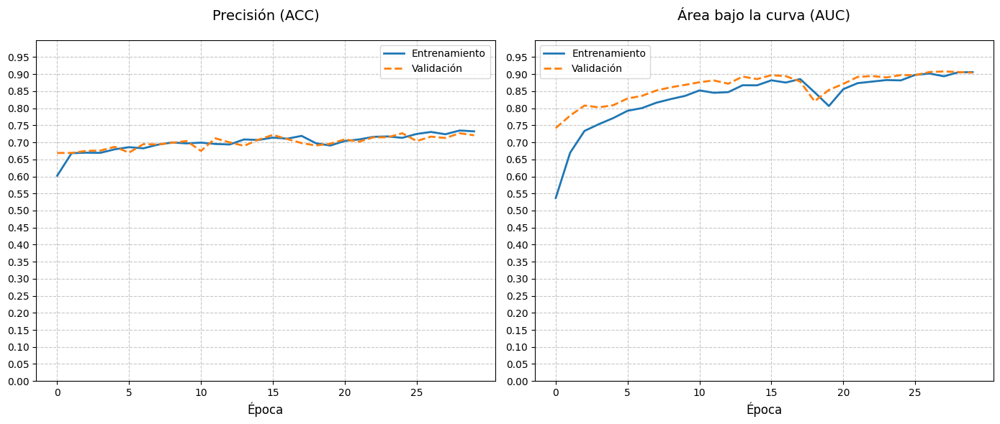

In [40]:
graficar_metricas(train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist)

Limpiar memoria

In [41]:
liberar_memoria_gpu()

Memoria libre: 35.42 GB


---

# 8. ViT Data_Augmentation

> - Train -> ACC=  AUC=  
> - Val ----> ACC=  AUC=  
> - Test --> ACC=  AUC=  

Layers where kernel_size(k), padding(p) and stride(s):

\begin{array}{l}
\text{Input: 224x224x3} \\
\downarrow \\
\text{Patch Embedding (16x16)} \rightarrow \text{196 patches} \rightarrow \mathrm{Linear_{768}} \\
\downarrow \\
\text{Concat [class\_token]} \rightarrow \text{Add Positional Embeddings} \rightarrow \mathrm{Dropout_{10\%}} \\
\downarrow \\
\begin{array}{|l|}
\hline
\text{Transformer Encoder (x6 layers):} \\
\quad \text{LayerNorm} \rightarrow \mathrm{MultiHeadAttention_{8\,heads}} \rightarrow \mathrm{Dropout_{10\%}} \\
\quad \text{Add \& Norm} \\
\quad \mathrm{MLP_{3072}} \rightarrow \text{GELU} \rightarrow \mathrm{Dropout_{10\%}} \rightarrow \mathrm{Linear_{768}} \\
\quad \text{Add \& Norm} \\
\hline
\end{array} \\
\downarrow \\
\text{Extract [class\_token]} \rightarrow \mathrm{LayerNorm} \rightarrow \mathrm{Linear_{7}} \\
\downarrow \\
\text{Output: num\_classes}
\end{array}

Arquitectura del modelo MLP

In [42]:
# Verificar dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Volver a inicializar el modelo
model = VisionTransformer(
    input_resolution=input_resolution,
    num_classes=num_classes,
    patch_size=16,
    in_channels=3,
    depth=6,
    num_heads=8
).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

Entrenamiento del modelo con validacion

In [43]:
train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist = entrenar_modelo(
    model,
    trainAUG_loader,
    val_loader,
    criterion,
    optimizer,
    num_epochs,
    device
)

Época 1/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.11batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 1/30:
Entrenamiento - ACC: 0.6172 | AUC: 0.5529
Validación    - ACC: 0.6690 | AUC: 0.7110



Época 2/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.674]



RESUMEN ÉPOCA 2/30:
Entrenamiento - ACC: 0.6666 | AUC: 0.6785
Validación    - ACC: 0.6740 | AUC: 0.7710



Época 3/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.668]



RESUMEN ÉPOCA 3/30:
Entrenamiento - ACC: 0.6753 | AUC: 0.7450
Validación    - ACC: 0.6680 | AUC: 0.7798



Época 4/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 4/30:
Entrenamiento - ACC: 0.6703 | AUC: 0.6993
Validación    - ACC: 0.6690 | AUC: 0.7436



Época 5/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.12batch/s, precisión_lote=0.659]



RESUMEN ÉPOCA 5/30:
Entrenamiento - ACC: 0.6706 | AUC: 0.7432
Validación    - ACC: 0.6590 | AUC: 0.7830



Época 6/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.683]



RESUMEN ÉPOCA 6/30:
Entrenamiento - ACC: 0.6719 | AUC: 0.7645
Validación    - ACC: 0.6830 | AUC: 0.8045



Época 7/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.11batch/s, precisión_lote=0.677]



RESUMEN ÉPOCA 7/30:
Entrenamiento - ACC: 0.6735 | AUC: 0.7659
Validación    - ACC: 0.6770 | AUC: 0.8210



Época 8/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.11batch/s, precisión_lote=0.689]



RESUMEN ÉPOCA 8/30:
Entrenamiento - ACC: 0.6813 | AUC: 0.7651
Validación    - ACC: 0.6889 | AUC: 0.8299



Época 9/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.12batch/s, precisión_lote=0.686]



RESUMEN ÉPOCA 9/30:
Entrenamiento - ACC: 0.6947 | AUC: 0.7948
Validación    - ACC: 0.6859 | AUC: 0.8227



Época 10/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.690]



RESUMEN ÉPOCA 10/30:
Entrenamiento - ACC: 0.6902 | AUC: 0.8010
Validación    - ACC: 0.6899 | AUC: 0.8396



Época 11/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.08batch/s, precisión_lote=0.689]



RESUMEN ÉPOCA 11/30:
Entrenamiento - ACC: 0.6859 | AUC: 0.7919
Validación    - ACC: 0.6889 | AUC: 0.8434



Época 12/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.684]



RESUMEN ÉPOCA 12/30:
Entrenamiento - ACC: 0.6873 | AUC: 0.8009
Validación    - ACC: 0.6839 | AUC: 0.8304



Época 13/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.15batch/s, precisión_lote=0.691]



RESUMEN ÉPOCA 13/30:
Entrenamiento - ACC: 0.6832 | AUC: 0.7997
Validación    - ACC: 0.6909 | AUC: 0.8237



Época 14/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.11batch/s, precisión_lote=0.688]



RESUMEN ÉPOCA 14/30:
Entrenamiento - ACC: 0.6723 | AUC: 0.7900
Validación    - ACC: 0.6879 | AUC: 0.8471



Época 15/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.682]



RESUMEN ÉPOCA 15/30:
Entrenamiento - ACC: 0.6902 | AUC: 0.8175
Validación    - ACC: 0.6820 | AUC: 0.8492



Época 16/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.12batch/s, precisión_lote=0.687]



RESUMEN ÉPOCA 16/30:
Entrenamiento - ACC: 0.6910 | AUC: 0.8248
Validación    - ACC: 0.6869 | AUC: 0.8651



Época 17/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.09batch/s, precisión_lote=0.680]



RESUMEN ÉPOCA 17/30:
Entrenamiento - ACC: 0.6860 | AUC: 0.8217
Validación    - ACC: 0.6800 | AUC: 0.8571



Época 18/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.678]



RESUMEN ÉPOCA 18/30:
Entrenamiento - ACC: 0.6786 | AUC: 0.8127
Validación    - ACC: 0.6780 | AUC: 0.8721



Época 19/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.12batch/s, precisión_lote=0.704]



RESUMEN ÉPOCA 19/30:
Entrenamiento - ACC: 0.6916 | AUC: 0.8539
Validación    - ACC: 0.7039 | AUC: 0.8750



Época 20/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.11batch/s, precisión_lote=0.691]



RESUMEN ÉPOCA 20/30:
Entrenamiento - ACC: 0.6960 | AUC: 0.8571
Validación    - ACC: 0.6909 | AUC: 0.8801



Época 21/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.701]



RESUMEN ÉPOCA 21/30:
Entrenamiento - ACC: 0.6875 | AUC: 0.8480
Validación    - ACC: 0.7009 | AUC: 0.8735



Época 22/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.638]



RESUMEN ÉPOCA 22/30:
Entrenamiento - ACC: 0.6939 | AUC: 0.8589
Validación    - ACC: 0.6381 | AUC: 0.8812



Época 23/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.684]



RESUMEN ÉPOCA 23/30:
Entrenamiento - ACC: 0.7020 | AUC: 0.8670
Validación    - ACC: 0.6839 | AUC: 0.8704



Época 24/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.688]



RESUMEN ÉPOCA 24/30:
Entrenamiento - ACC: 0.6974 | AUC: 0.8681
Validación    - ACC: 0.6879 | AUC: 0.8707



Época 25/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.705]



RESUMEN ÉPOCA 25/30:
Entrenamiento - ACC: 0.7000 | AUC: 0.8685
Validación    - ACC: 0.7049 | AUC: 0.8815



Época 26/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.12batch/s, precisión_lote=0.700]



RESUMEN ÉPOCA 26/30:
Entrenamiento - ACC: 0.6934 | AUC: 0.8624
Validación    - ACC: 0.6999 | AUC: 0.8786



Época 27/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.12batch/s, precisión_lote=0.697]



RESUMEN ÉPOCA 27/30:
Entrenamiento - ACC: 0.6947 | AUC: 0.8670
Validación    - ACC: 0.6969 | AUC: 0.8834



Época 28/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.11batch/s, precisión_lote=0.690]



RESUMEN ÉPOCA 28/30:
Entrenamiento - ACC: 0.6879 | AUC: 0.8514
Validación    - ACC: 0.6899 | AUC: 0.8630



Época 29/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.690]



RESUMEN ÉPOCA 29/30:
Entrenamiento - ACC: 0.6887 | AUC: 0.8475
Validación    - ACC: 0.6899 | AUC: 0.8538



Época 30/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.10batch/s, precisión_lote=0.694]


RESUMEN ÉPOCA 30/30:
Entrenamiento - ACC: 0.6944 | AUC: 0.8628
Validación    - ACC: 0.6939 | AUC: 0.8703



Evaluacion conjunto de prueba

In [44]:
evaluar_modelo(model, test_loader, device)


Métricas finales en prueba:
ACC: 0.6883  AUC: 0.8808


Grafica de precision y area bajo la curva

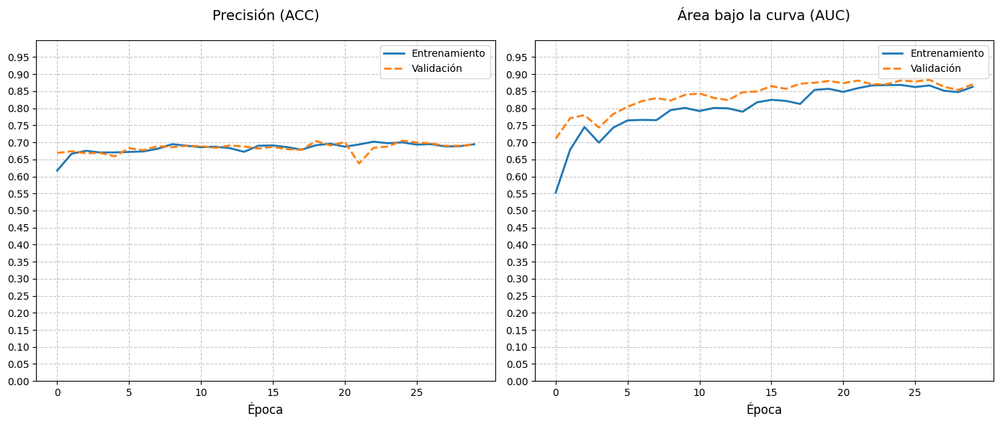

In [45]:
graficar_metricas(train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist)

Limpiar memoria

In [46]:
liberar_memoria_gpu()

Memoria libre: 37.58 GB


---

# 9. ViT con WeightDecay y Dropout

> - Train -> ACC=  AUC=  
> - Val ----> ACC=  AUC=  
> - Test --> ACC=  AUC=  

Layers where kernel_size(k), padding(p) and stride(s):

\begin{array}{l}
\text{Input: 224x224x3} \\
\downarrow \\
\text{Patch Embedding (16x16)} \rightarrow \text{196 patches} \rightarrow \mathrm{Linear_{768}} \\
\downarrow \\
\text{Concat [class\_token]} \rightarrow \text{Add Positional Embeddings} \rightarrow \mathrm{Dropout_{10\%}} \\
\downarrow \\
\begin{array}{|l|}
\hline
\text{Transformer Encoder (x6 layers):} \\
\quad \text{LayerNorm} \rightarrow \mathrm{MultiHeadAttention_{8\,heads}} \rightarrow \mathrm{Dropout_{10\%}} \\
\quad \text{Add \& Norm} \\
\quad \mathrm{MLP_{3072}} \rightarrow \text{GELU} \rightarrow \mathrm{Dropout_{10\%}} \rightarrow \mathrm{Linear_{768}} \\
\quad \text{Add \& Norm} \\
\hline
\end{array} \\
\downarrow \\
\text{Extract [class\_token]} \rightarrow \mathrm{LayerNorm} \rightarrow \mathrm{Linear_{7}} \\
\downarrow \\
\text{Output: num\_classes}
\end{array}

Arquitectura del modelo MLP

In [47]:
# Verificar dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Capa de Embedding de Parches
class PatchEmbedding(nn.Module):
    def __init__(self, input_resolution, embed_dim, patch_size=16, in_channels=3):
        super().__init__()
        self.input_resolution = input_resolution
        self.patch_size = patch_size
        self.num_patches = (input_resolution // patch_size) ** 2
        self.proj = nn.Linear(in_channels * patch_size**2, embed_dim)
        self.cls_token = nn.Parameter(torch.zeros(1, 1, embed_dim))
        self.positions = nn.Parameter(torch.randn(1, self.num_patches + 1, embed_dim))

    def forward(self, x):
        B, C, H, W = x.shape
        p = self.patch_size
        x = x.reshape(B, C, H//p, p, W//p, p)
        x = x.permute(0, 2, 4, 1, 3, 5)
        x = x.flatten(1, 2).flatten(2, 4)
        x = self.proj(x)
        cls_token = self.cls_token.expand(B, -1, -1)
        x = torch.cat([cls_token, x], dim=1)
        x += self.positions
        return x

# Capa del Encoder Transformer con Dropout
class TransformerEncoderLayer(nn.Module):
    def __init__(self, embed_dim, num_heads, dropout_rate, mlp_ratio):
        super().__init__()
        self.norm1 = nn.LayerNorm(embed_dim)
        self.attn = nn.MultiheadAttention(
            embed_dim,
            num_heads,
            dropout=dropout_rate,  # Dropout en atención
            batch_first=True
        )
        self.dropout = nn.Dropout(dropout_rate)  # Dropout
        self.norm2 = nn.LayerNorm(embed_dim)
        mlp_hidden_dim = int(embed_dim * mlp_ratio)
        self.mlp = nn.Sequential(
            nn.Linear(embed_dim, mlp_hidden_dim),
            nn.GELU(),
            nn.Dropout(dropout_rate),  # Dropout en MLP
            nn.Linear(mlp_hidden_dim, embed_dim)
        )

    def forward(self, x):
        # Atención con residual connection y dropout
        attn_output, _ = self.attn(self.norm1(x), self.norm1(x), self.norm1(x))
        x = x + self.dropout(attn_output)

        # MLP con residual connection y dropout
        mlp_output = self.mlp(self.norm2(x))
        x = x + self.dropout(mlp_output)
        return x

# Vision Transformer modificado
class VisionTransformer(nn.Module):
    def __init__(self, input_resolution, num_classes, dropout_rate, patch_size=16, in_channels=3,
                 depth=12, num_heads=12, mlp_ratio=4.0):
        super().__init__()
        embed_dim = patch_size**2 * in_channels
        self.patch_embed = PatchEmbedding(input_resolution, embed_dim, patch_size, in_channels)
        self.layers = nn.ModuleList([
            TransformerEncoderLayer(
                embed_dim,
                num_heads,
                dropout_rate=dropout_rate,
                mlp_ratio = mlp_ratio
            ) for _ in range(depth)
        ])
        self.norm = nn.LayerNorm(embed_dim)
        self.head = nn.Linear(embed_dim, num_classes)

    def forward(self, x):
        x = self.patch_embed(x)
        for layer in self.layers:
            x = layer(x)
        return self.head(self.norm(x)[:, 0])

# Inicializar el modelo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = VisionTransformer(
    input_resolution=input_resolution,
    num_classes=num_classes,
    dropout_rate=0.2,
    patch_size=16,
    in_channels=3,
    depth=6,
    num_heads=8,
).to(device)

# Optimizador con Weight Decay
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(
    model.parameters(),
    lr=learning_rate,
    weight_decay=weight_decay
)

Entrenamiento del modelo con validacion

In [48]:
train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist = entrenar_modelo(
    model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    num_epochs,
    device
)

Época 1/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.11batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 1/30:
Entrenamiento - ACC: 0.6325 | AUC: 0.5426
Validación    - ACC: 0.6690 | AUC: 0.7568



Época 2/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.07batch/s, precisión_lote=0.670]



RESUMEN ÉPOCA 2/30:
Entrenamiento - ACC: 0.6660 | AUC: 0.7224
Validación    - ACC: 0.6700 | AUC: 0.7890



Época 3/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.10batch/s, precisión_lote=0.667]



RESUMEN ÉPOCA 3/30:
Entrenamiento - ACC: 0.6738 | AUC: 0.7554
Validación    - ACC: 0.6670 | AUC: 0.7946



Época 4/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.683]



RESUMEN ÉPOCA 4/30:
Entrenamiento - ACC: 0.6749 | AUC: 0.7775
Validación    - ACC: 0.6830 | AUC: 0.8054



Época 5/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.12batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 5/30:
Entrenamiento - ACC: 0.6776 | AUC: 0.7864
Validación    - ACC: 0.6690 | AUC: 0.8148



Época 6/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.11batch/s, precisión_lote=0.700]



RESUMEN ÉPOCA 6/30:
Entrenamiento - ACC: 0.6819 | AUC: 0.7885
Validación    - ACC: 0.6999 | AUC: 0.8091



Época 7/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.696]



RESUMEN ÉPOCA 7/30:
Entrenamiento - ACC: 0.6892 | AUC: 0.8007
Validación    - ACC: 0.6959 | AUC: 0.8427



Época 8/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.684]



RESUMEN ÉPOCA 8/30:
Entrenamiento - ACC: 0.6852 | AUC: 0.8023
Validación    - ACC: 0.6839 | AUC: 0.8488



Época 9/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.695]



RESUMEN ÉPOCA 9/30:
Entrenamiento - ACC: 0.6890 | AUC: 0.8023
Validación    - ACC: 0.6949 | AUC: 0.8504



Época 10/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.10batch/s, precisión_lote=0.702]



RESUMEN ÉPOCA 10/30:
Entrenamiento - ACC: 0.6862 | AUC: 0.8343
Validación    - ACC: 0.7019 | AUC: 0.8638



Época 11/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.691]



RESUMEN ÉPOCA 11/30:
Entrenamiento - ACC: 0.6846 | AUC: 0.8357
Validación    - ACC: 0.6909 | AUC: 0.8663



Época 12/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.12batch/s, precisión_lote=0.700]



RESUMEN ÉPOCA 12/30:
Entrenamiento - ACC: 0.6880 | AUC: 0.8487
Validación    - ACC: 0.6999 | AUC: 0.8701



Época 13/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.690]



RESUMEN ÉPOCA 13/30:
Entrenamiento - ACC: 0.6927 | AUC: 0.8598
Validación    - ACC: 0.6899 | AUC: 0.8838



Época 14/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.706]



RESUMEN ÉPOCA 14/30:
Entrenamiento - ACC: 0.6940 | AUC: 0.8570
Validación    - ACC: 0.7059 | AUC: 0.8853



Época 15/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.10batch/s, precisión_lote=0.692]



RESUMEN ÉPOCA 15/30:
Entrenamiento - ACC: 0.6942 | AUC: 0.8651
Validación    - ACC: 0.6919 | AUC: 0.8908



Época 16/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.12batch/s, precisión_lote=0.680]



RESUMEN ÉPOCA 16/30:
Entrenamiento - ACC: 0.6889 | AUC: 0.8600
Validación    - ACC: 0.6800 | AUC: 0.8689



Época 17/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.15batch/s, precisión_lote=0.697]



RESUMEN ÉPOCA 17/30:
Entrenamiento - ACC: 0.6923 | AUC: 0.8394
Validación    - ACC: 0.6969 | AUC: 0.8731



Época 18/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.12batch/s, precisión_lote=0.706]



RESUMEN ÉPOCA 18/30:
Entrenamiento - ACC: 0.6972 | AUC: 0.8608
Validación    - ACC: 0.7059 | AUC: 0.8639



Época 19/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.07batch/s, precisión_lote=0.698]



RESUMEN ÉPOCA 19/30:
Entrenamiento - ACC: 0.6967 | AUC: 0.8585
Validación    - ACC: 0.6979 | AUC: 0.8842



Época 20/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.692]



RESUMEN ÉPOCA 20/30:
Entrenamiento - ACC: 0.7026 | AUC: 0.8682
Validación    - ACC: 0.6919 | AUC: 0.8871



Época 21/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.701]



RESUMEN ÉPOCA 21/30:
Entrenamiento - ACC: 0.7023 | AUC: 0.8707
Validación    - ACC: 0.7009 | AUC: 0.8597



Época 22/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.698]



RESUMEN ÉPOCA 22/30:
Entrenamiento - ACC: 0.6937 | AUC: 0.8582
Validación    - ACC: 0.6979 | AUC: 0.8851



Época 23/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.10batch/s, precisión_lote=0.707]



RESUMEN ÉPOCA 23/30:
Entrenamiento - ACC: 0.7084 | AUC: 0.8774
Validación    - ACC: 0.7069 | AUC: 0.8854



Época 24/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.724]



RESUMEN ÉPOCA 24/30:
Entrenamiento - ACC: 0.7016 | AUC: 0.8706
Validación    - ACC: 0.7238 | AUC: 0.8969



Época 25/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.12batch/s, precisión_lote=0.698]



RESUMEN ÉPOCA 25/30:
Entrenamiento - ACC: 0.7060 | AUC: 0.8765
Validación    - ACC: 0.6979 | AUC: 0.8969



Época 26/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.699]



RESUMEN ÉPOCA 26/30:
Entrenamiento - ACC: 0.7002 | AUC: 0.8765
Validación    - ACC: 0.6989 | AUC: 0.8904



Época 27/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.08batch/s, precisión_lote=0.693]



RESUMEN ÉPOCA 27/30:
Entrenamiento - ACC: 0.7067 | AUC: 0.8780
Validación    - ACC: 0.6929 | AUC: 0.8700



Época 28/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.09batch/s, precisión_lote=0.702]



RESUMEN ÉPOCA 28/30:
Entrenamiento - ACC: 0.6916 | AUC: 0.8645
Validación    - ACC: 0.7019 | AUC: 0.8917



Época 29/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.711]



RESUMEN ÉPOCA 29/30:
Entrenamiento - ACC: 0.7064 | AUC: 0.8790
Validación    - ACC: 0.7109 | AUC: 0.8939



Época 30/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.707]


RESUMEN ÉPOCA 30/30:
Entrenamiento - ACC: 0.7109 | AUC: 0.8869
Validación    - ACC: 0.7069 | AUC: 0.8988



Evaluacion conjunto de prueba

In [49]:
evaluar_modelo(model, test_loader, device)


Métricas finales en prueba:
ACC: 0.7207  AUC: 0.8988


Grafica de precision y area bajo la curva

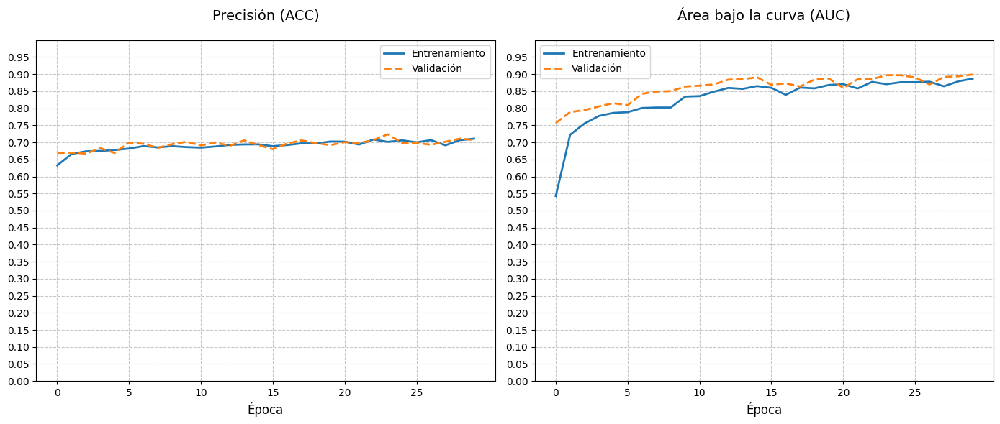

In [50]:
graficar_metricas(train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist)

Limpiar memoria

In [51]:
liberar_memoria_gpu()

Memoria libre: 36.99 GB


---

# 10. ViT Data-Augmentation con WeightDecay y Dropout

> - Train -> ACC=  AUC=  
> - Val ----> ACC=  AUC=  
> - Test --> ACC=  AUC=  

Layers where kernel_size(k), padding(p) and stride(s):

\begin{array}{l}
\text{Input: 224x224x3} \\
\downarrow \\
\text{Patch Embedding (16x16)} \rightarrow \text{196 patches} \rightarrow \mathrm{Linear_{768}} \\
\downarrow \\
\text{Concat [class\_token]} \rightarrow \text{Add Positional Embeddings} \rightarrow \mathrm{Dropout_{10\%}} \\
\downarrow \\
\begin{array}{|l|}
\hline
\text{Transformer Encoder (x6 layers):} \\
\quad \text{LayerNorm} \rightarrow \mathrm{MultiHeadAttention_{8\,heads}} \rightarrow \mathrm{Dropout_{10\%}} \\
\quad \text{Add \& Norm} \\
\quad \mathrm{MLP_{3072}} \rightarrow \text{GELU} \rightarrow \mathrm{Dropout_{10\%}} \rightarrow \mathrm{Linear_{768}} \\
\quad \text{Add \& Norm} \\
\hline
\end{array} \\
\downarrow \\
\text{Extract [class\_token]} \rightarrow \mathrm{LayerNorm} \rightarrow \mathrm{Linear_{7}} \\
\downarrow \\
\text{Output: num\_classes}
\end{array}

Arquitectura del modelo MLP

In [52]:
# Verificar dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Volver a inicializar el modelo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = VisionTransformer(
    input_resolution=input_resolution,
    num_classes=num_classes,
    dropout_rate=0.2,
    patch_size=16,
    in_channels=3,
    depth=6,
    num_heads=8,
).to(device)

# Optimizador con Weight Decay
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(
    model.parameters(),
    lr=learning_rate,
    weight_decay=weight_decay
)

Entrenamiento del modelo con validacion

In [53]:
train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist = entrenar_modelo(
    model,
    trainAUG_loader,
    val_loader,
    criterion,
    optimizer,
    num_epochs,
    device
)

Época 1/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 1/30:
Entrenamiento - ACC: 0.6459 | AUC: 0.5560
Validación    - ACC: 0.6690 | AUC: 0.7408



Época 2/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.673]



RESUMEN ÉPOCA 2/30:
Entrenamiento - ACC: 0.6669 | AUC: 0.6956
Validación    - ACC: 0.6730 | AUC: 0.7704



Época 3/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.07batch/s, precisión_lote=0.670]



RESUMEN ÉPOCA 3/30:
Entrenamiento - ACC: 0.6709 | AUC: 0.7321
Validación    - ACC: 0.6700 | AUC: 0.7924



Época 4/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.16batch/s, precisión_lote=0.672]



RESUMEN ÉPOCA 4/30:
Entrenamiento - ACC: 0.6726 | AUC: 0.7634
Validación    - ACC: 0.6720 | AUC: 0.7930



Época 5/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.12batch/s, precisión_lote=0.661]



RESUMEN ÉPOCA 5/30:
Entrenamiento - ACC: 0.6745 | AUC: 0.7793
Validación    - ACC: 0.6610 | AUC: 0.7947



Época 6/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.10batch/s, precisión_lote=0.686]



RESUMEN ÉPOCA 6/30:
Entrenamiento - ACC: 0.6753 | AUC: 0.7768
Validación    - ACC: 0.6859 | AUC: 0.7937



Época 7/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.662]



RESUMEN ÉPOCA 7/30:
Entrenamiento - ACC: 0.6762 | AUC: 0.7858
Validación    - ACC: 0.6620 | AUC: 0.8060



Época 8/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.677]



RESUMEN ÉPOCA 8/30:
Entrenamiento - ACC: 0.6796 | AUC: 0.7973
Validación    - ACC: 0.6770 | AUC: 0.8315



Época 9/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.675]



RESUMEN ÉPOCA 9/30:
Entrenamiento - ACC: 0.6792 | AUC: 0.7866
Validación    - ACC: 0.6750 | AUC: 0.8378



Época 10/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.685]



RESUMEN ÉPOCA 10/30:
Entrenamiento - ACC: 0.6787 | AUC: 0.8238
Validación    - ACC: 0.6849 | AUC: 0.8548



Época 11/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.12batch/s, precisión_lote=0.678]



RESUMEN ÉPOCA 11/30:
Entrenamiento - ACC: 0.6903 | AUC: 0.8412
Validación    - ACC: 0.6780 | AUC: 0.8578



Época 12/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.678]



RESUMEN ÉPOCA 12/30:
Entrenamiento - ACC: 0.6872 | AUC: 0.8383
Validación    - ACC: 0.6780 | AUC: 0.8878



Época 13/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.702]



RESUMEN ÉPOCA 13/30:
Entrenamiento - ACC: 0.6923 | AUC: 0.8478
Validación    - ACC: 0.7019 | AUC: 0.8829



Época 14/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.703]



RESUMEN ÉPOCA 14/30:
Entrenamiento - ACC: 0.6903 | AUC: 0.8519
Validación    - ACC: 0.7029 | AUC: 0.8793



Época 15/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.723]



RESUMEN ÉPOCA 15/30:
Entrenamiento - ACC: 0.6967 | AUC: 0.8688
Validación    - ACC: 0.7228 | AUC: 0.8864



Época 16/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.11batch/s, precisión_lote=0.711]



RESUMEN ÉPOCA 16/30:
Entrenamiento - ACC: 0.7036 | AUC: 0.8671
Validación    - ACC: 0.7109 | AUC: 0.8937



Época 17/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.12batch/s, precisión_lote=0.665]



RESUMEN ÉPOCA 17/30:
Entrenamiento - ACC: 0.6987 | AUC: 0.8652
Validación    - ACC: 0.6650 | AUC: 0.8910



Época 18/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.688]



RESUMEN ÉPOCA 18/30:
Entrenamiento - ACC: 0.7069 | AUC: 0.8774
Validación    - ACC: 0.6879 | AUC: 0.8893



Época 19/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.04batch/s, precisión_lote=0.704]



RESUMEN ÉPOCA 19/30:
Entrenamiento - ACC: 0.7110 | AUC: 0.8770
Validación    - ACC: 0.7039 | AUC: 0.9011



Época 20/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.685]



RESUMEN ÉPOCA 20/30:
Entrenamiento - ACC: 0.7047 | AUC: 0.8809
Validación    - ACC: 0.6849 | AUC: 0.8936



Época 21/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.15batch/s, precisión_lote=0.712]



RESUMEN ÉPOCA 21/30:
Entrenamiento - ACC: 0.7040 | AUC: 0.8801
Validación    - ACC: 0.7119 | AUC: 0.8906



Época 22/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.719]



RESUMEN ÉPOCA 22/30:
Entrenamiento - ACC: 0.7094 | AUC: 0.8802
Validación    - ACC: 0.7188 | AUC: 0.8946



Época 23/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.691]



RESUMEN ÉPOCA 23/30:
Entrenamiento - ACC: 0.7066 | AUC: 0.8805
Validación    - ACC: 0.6909 | AUC: 0.8868



Época 24/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.677]



RESUMEN ÉPOCA 24/30:
Entrenamiento - ACC: 0.7143 | AUC: 0.8913
Validación    - ACC: 0.6770 | AUC: 0.9004



Época 25/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.702]



RESUMEN ÉPOCA 25/30:
Entrenamiento - ACC: 0.7123 | AUC: 0.8827
Validación    - ACC: 0.7019 | AUC: 0.8985



Época 26/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.14batch/s, precisión_lote=0.705]



RESUMEN ÉPOCA 26/30:
Entrenamiento - ACC: 0.7119 | AUC: 0.8861
Validación    - ACC: 0.7049 | AUC: 0.8880



Época 27/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.08batch/s, precisión_lote=0.726]



RESUMEN ÉPOCA 27/30:
Entrenamiento - ACC: 0.7012 | AUC: 0.8699
Validación    - ACC: 0.7258 | AUC: 0.9109



Época 28/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.724]



RESUMEN ÉPOCA 28/30:
Entrenamiento - ACC: 0.7113 | AUC: 0.8865
Validación    - ACC: 0.7238 | AUC: 0.8989



Época 29/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.11batch/s, precisión_lote=0.711]



RESUMEN ÉPOCA 29/30:
Entrenamiento - ACC: 0.7107 | AUC: 0.8863
Validación    - ACC: 0.7109 | AUC: 0.9002



Época 30/30 [Validación]: 100%|██████████| 4/4 [00:01<00:00,  2.13batch/s, precisión_lote=0.708]


RESUMEN ÉPOCA 30/30:
Entrenamiento - ACC: 0.7231 | AUC: 0.8893
Validación    - ACC: 0.7079 | AUC: 0.8975



Evaluacion conjunto de prueba

In [54]:
evaluar_modelo(model, test_loader, device)


Métricas finales en prueba:
ACC: 0.7027  AUC: 0.9000


Grafica de precision y area bajo la curva

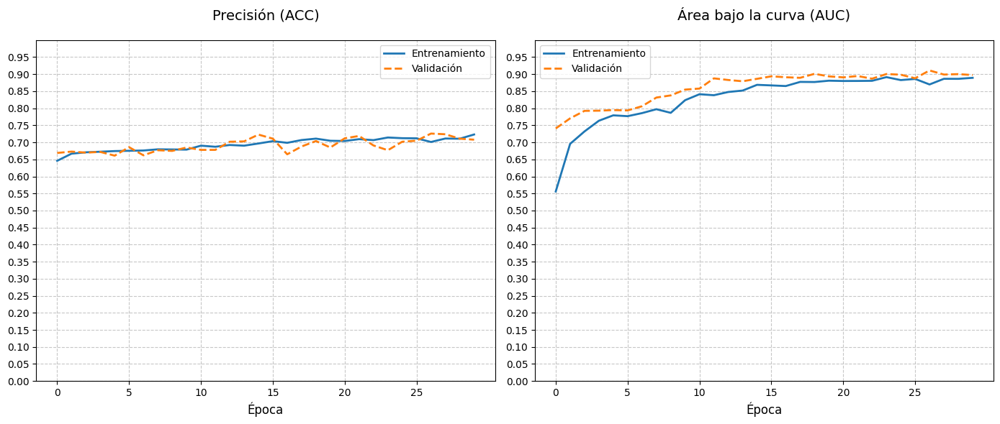

In [55]:
graficar_metricas(train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist)

Limpiar memoria

In [56]:
liberar_memoria_gpu()

Memoria libre: 36.79 GB


---

# 11. ViT vit_b_16 de Google

> - Train -> ACC=  AUC=  
> - Val ----> ACC=  AUC=  
> - Test --> ACC=  AUC=  

Layers where kernel_size(k), padding(p) and stride(s):

\begin{array}{l}
\text{Input: 224x224x3} \\
\downarrow \\
\text{Patch Embedding (16x16)} \rightarrow \text{196 patches} \rightarrow \mathrm{Linear_{768}} \\
\downarrow \\
\text{Concat [class\_token]} \rightarrow \text{Add Positional Embeddings} \rightarrow \mathrm{Dropout_{10\%}} \\
\downarrow \\
\begin{array}{|l|}
\hline
\text{Transformer Encoder (x6 layers):} \\
\quad \text{LayerNorm} \rightarrow \mathrm{MultiHeadAttention_{8\,heads}} \rightarrow \mathrm{Dropout_{10\%}} \\
\quad \text{Add \& Norm} \\
\quad \mathrm{MLP_{3072}} \rightarrow \text{GELU} \rightarrow \mathrm{Dropout_{10\%}} \rightarrow \mathrm{Linear_{768}} \\
\quad \text{Add \& Norm} \\
\hline
\end{array} \\
\downarrow \\
\text{Extract [class\_token]} \rightarrow \mathrm{LayerNorm} \rightarrow \mathrm{Linear_{7}} \\
\downarrow \\
\text{Output: num\_classes}
\end{array}

Arquitectura del modelo MLP

In [57]:
# Verificar dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Configuración del modelo (parámetros originales del paper)
model = models.vit_b_16(
    weights=None,                   # Sin pesos preentrenados
    image_size=input_resolution,    # Tamaño de entrada
    num_classes=num_classes
).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

Entrenamiento del modelo con validacion

In [58]:
train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist = entrenar_modelo(
    model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    num_epochs,
    device
)

Época 1/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 1/30:
Entrenamiento - ACC: 0.6304 | AUC: 0.5109
Validación    - ACC: 0.6690 | AUC: 0.6197



Época 2/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 2/30:
Entrenamiento - ACC: 0.6693 | AUC: 0.6043
Validación    - ACC: 0.6690 | AUC: 0.6302



Época 3/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.42batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 3/30:
Entrenamiento - ACC: 0.6693 | AUC: 0.5815
Validación    - ACC: 0.6690 | AUC: 0.4152



Época 4/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 4/30:
Entrenamiento - ACC: 0.6693 | AUC: 0.5006
Validación    - ACC: 0.6690 | AUC: 0.5901



Época 5/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 5/30:
Entrenamiento - ACC: 0.6698 | AUC: 0.5013
Validación    - ACC: 0.6690 | AUC: 0.6482



Época 6/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 6/30:
Entrenamiento - ACC: 0.6698 | AUC: 0.5206
Validación    - ACC: 0.6690 | AUC: 0.6543



Época 7/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 7/30:
Entrenamiento - ACC: 0.6698 | AUC: 0.5530
Validación    - ACC: 0.6690 | AUC: 0.6590



Época 8/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 8/30:
Entrenamiento - ACC: 0.6698 | AUC: 0.5532
Validación    - ACC: 0.6690 | AUC: 0.6885



Época 9/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.670]



RESUMEN ÉPOCA 9/30:
Entrenamiento - ACC: 0.6673 | AUC: 0.5699
Validación    - ACC: 0.6700 | AUC: 0.6568



Época 10/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 10/30:
Entrenamiento - ACC: 0.6695 | AUC: 0.6245
Validación    - ACC: 0.6690 | AUC: 0.7200



Época 11/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.678]



RESUMEN ÉPOCA 11/30:
Entrenamiento - ACC: 0.6658 | AUC: 0.6514
Validación    - ACC: 0.6780 | AUC: 0.7054



Época 12/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.41batch/s, precisión_lote=0.676]



RESUMEN ÉPOCA 12/30:
Entrenamiento - ACC: 0.6713 | AUC: 0.6611
Validación    - ACC: 0.6760 | AUC: 0.7134



Época 13/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.666]



RESUMEN ÉPOCA 13/30:
Entrenamiento - ACC: 0.6690 | AUC: 0.6993
Validación    - ACC: 0.6660 | AUC: 0.7534



Época 14/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.42batch/s, precisión_lote=0.671]



RESUMEN ÉPOCA 14/30:
Entrenamiento - ACC: 0.6706 | AUC: 0.7090
Validación    - ACC: 0.6710 | AUC: 0.7422



Época 15/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.664]



RESUMEN ÉPOCA 15/30:
Entrenamiento - ACC: 0.6722 | AUC: 0.7101
Validación    - ACC: 0.6640 | AUC: 0.7492



Época 16/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.678]



RESUMEN ÉPOCA 16/30:
Entrenamiento - ACC: 0.6713 | AUC: 0.7105
Validación    - ACC: 0.6780 | AUC: 0.7494



Época 17/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.42batch/s, precisión_lote=0.666]



RESUMEN ÉPOCA 17/30:
Entrenamiento - ACC: 0.6663 | AUC: 0.7123
Validación    - ACC: 0.6660 | AUC: 0.7177



Época 18/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 18/30:
Entrenamiento - ACC: 0.6659 | AUC: 0.6810
Validación    - ACC: 0.6690 | AUC: 0.7253



Época 19/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.677]



RESUMEN ÉPOCA 19/30:
Entrenamiento - ACC: 0.6716 | AUC: 0.7061
Validación    - ACC: 0.6770 | AUC: 0.7896



Época 20/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.678]



RESUMEN ÉPOCA 20/30:
Entrenamiento - ACC: 0.6726 | AUC: 0.7470
Validación    - ACC: 0.6780 | AUC: 0.7770



Época 21/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.672]



RESUMEN ÉPOCA 21/30:
Entrenamiento - ACC: 0.6709 | AUC: 0.7184
Validación    - ACC: 0.6720 | AUC: 0.7900



Época 22/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.42batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 22/30:
Entrenamiento - ACC: 0.6699 | AUC: 0.6747
Validación    - ACC: 0.6690 | AUC: 0.7691



Época 23/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 23/30:
Entrenamiento - ACC: 0.6690 | AUC: 0.7058
Validación    - ACC: 0.6690 | AUC: 0.7550



Época 24/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.674]



RESUMEN ÉPOCA 24/30:
Entrenamiento - ACC: 0.6712 | AUC: 0.7318
Validación    - ACC: 0.6740 | AUC: 0.7922



Época 25/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.672]



RESUMEN ÉPOCA 25/30:
Entrenamiento - ACC: 0.6709 | AUC: 0.7417
Validación    - ACC: 0.6720 | AUC: 0.7738



Época 26/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.677]



RESUMEN ÉPOCA 26/30:
Entrenamiento - ACC: 0.6700 | AUC: 0.7381
Validación    - ACC: 0.6770 | AUC: 0.7776



Época 27/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.677]



RESUMEN ÉPOCA 27/30:
Entrenamiento - ACC: 0.6706 | AUC: 0.7465
Validación    - ACC: 0.6770 | AUC: 0.7790



Época 28/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.673]



RESUMEN ÉPOCA 28/30:
Entrenamiento - ACC: 0.6753 | AUC: 0.7612
Validación    - ACC: 0.6730 | AUC: 0.7980



Época 29/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.680]



RESUMEN ÉPOCA 29/30:
Entrenamiento - ACC: 0.6742 | AUC: 0.7620
Validación    - ACC: 0.6800 | AUC: 0.7961



Época 30/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.678]


RESUMEN ÉPOCA 30/30:
Entrenamiento - ACC: 0.6742 | AUC: 0.7585
Validación    - ACC: 0.6780 | AUC: 0.8020



Evaluacion conjunto de prueba

In [59]:
evaluar_modelo(model, test_loader, device)


Métricas finales en prueba:
ACC: 0.6658  AUC: 0.7760


Grafica de precision y area bajo la curva

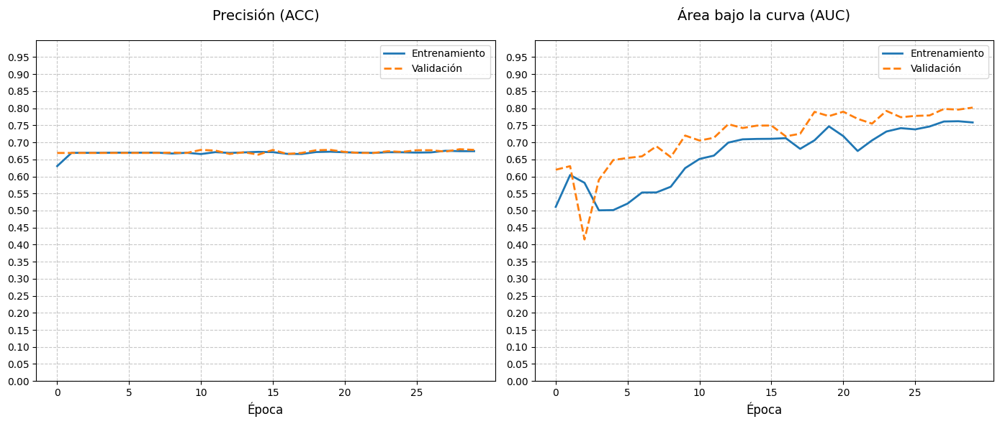

In [60]:
graficar_metricas(train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist)

Limpiar memoria

In [61]:
liberar_memoria_gpu()

Memoria libre: 36.49 GB


---

# 12. ViT Data-Augmentation vit_b_16 de Google

> - Train -> ACC=  AUC=  
> - Val ----> ACC=  AUC=  
> - Test --> ACC=  AUC=  

Layers where kernel_size(k), padding(p) and stride(s):

\begin{array}{l}
\text{Input: 224x224x3} \\
\downarrow \\
\text{Patch Embedding (16x16)} \rightarrow \text{196 patches} \rightarrow \mathrm{Linear_{768}} \\
\downarrow \\
\text{Concat [class\_token]} \rightarrow \text{Add Positional Embeddings} \rightarrow \mathrm{Dropout_{10\%}} \\
\downarrow \\
\begin{array}{|l|}
\hline
\text{Transformer Encoder (x6 layers):} \\
\quad \text{LayerNorm} \rightarrow \mathrm{MultiHeadAttention_{8\,heads}} \rightarrow \mathrm{Dropout_{10\%}} \\
\quad \text{Add \& Norm} \\
\quad \mathrm{MLP_{3072}} \rightarrow \text{GELU} \rightarrow \mathrm{Dropout_{10\%}} \rightarrow \mathrm{Linear_{768}} \\
\quad \text{Add \& Norm} \\
\hline
\end{array} \\
\downarrow \\
\text{Extract [class\_token]} \rightarrow \mathrm{LayerNorm} \rightarrow \mathrm{Linear_{7}} \\
\downarrow \\
\text{Output: num\_classes}
\end{array}

Arquitectura del modelo MLP

In [62]:
# Verificar dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Configuración del modelo (parámetros originales del paper)
model = models.vit_b_16(
    weights=None,                   # Sin pesos preentrenados
    image_size=input_resolution,    # Tamaño de entrada
    num_classes=num_classes
).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

Entrenamiento del modelo con validacion

In [63]:
train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist = entrenar_modelo(
    model,
    trainAUG_loader,
    val_loader,
    criterion,
    optimizer,
    num_epochs,
    device
)

Época 1/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 1/30:
Entrenamiento - ACC: 0.6438 | AUC: 0.5107
Validación    - ACC: 0.6690 | AUC: 0.6583



Época 2/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 2/30:
Entrenamiento - ACC: 0.6696 | AUC: 0.4959
Validación    - ACC: 0.6690 | AUC: 0.7006



Época 3/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 3/30:
Entrenamiento - ACC: 0.6692 | AUC: 0.5451
Validación    - ACC: 0.6690 | AUC: 0.7033



Época 4/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.45batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 4/30:
Entrenamiento - ACC: 0.6695 | AUC: 0.6050
Validación    - ACC: 0.6690 | AUC: 0.6978



Época 5/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 5/30:
Entrenamiento - ACC: 0.6709 | AUC: 0.6471
Validación    - ACC: 0.6690 | AUC: 0.7100



Época 6/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 6/30:
Entrenamiento - ACC: 0.6708 | AUC: 0.6851
Validación    - ACC: 0.6690 | AUC: 0.7597



Época 7/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.41batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 7/30:
Entrenamiento - ACC: 0.6690 | AUC: 0.7201
Validación    - ACC: 0.6690 | AUC: 0.7773



Época 8/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.677]



RESUMEN ÉPOCA 8/30:
Entrenamiento - ACC: 0.6730 | AUC: 0.7439
Validación    - ACC: 0.6770 | AUC: 0.7941



Época 9/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.41batch/s, precisión_lote=0.676]



RESUMEN ÉPOCA 9/30:
Entrenamiento - ACC: 0.6740 | AUC: 0.7733
Validación    - ACC: 0.6760 | AUC: 0.8166



Época 10/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.667]



RESUMEN ÉPOCA 10/30:
Entrenamiento - ACC: 0.6696 | AUC: 0.7936
Validación    - ACC: 0.6670 | AUC: 0.8161



Época 11/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.678]



RESUMEN ÉPOCA 11/30:
Entrenamiento - ACC: 0.6730 | AUC: 0.8001
Validación    - ACC: 0.6780 | AUC: 0.8136



Época 12/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.42batch/s, precisión_lote=0.676]



RESUMEN ÉPOCA 12/30:
Entrenamiento - ACC: 0.6732 | AUC: 0.7924
Validación    - ACC: 0.6760 | AUC: 0.8170



Época 13/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.660]



RESUMEN ÉPOCA 13/30:
Entrenamiento - ACC: 0.6748 | AUC: 0.8048
Validación    - ACC: 0.6600 | AUC: 0.8270



Época 14/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.40batch/s, precisión_lote=0.680]



RESUMEN ÉPOCA 14/30:
Entrenamiento - ACC: 0.6732 | AUC: 0.8113
Validación    - ACC: 0.6800 | AUC: 0.8334



Época 15/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.680]



RESUMEN ÉPOCA 15/30:
Entrenamiento - ACC: 0.6742 | AUC: 0.8414
Validación    - ACC: 0.6800 | AUC: 0.8392



Época 16/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.42batch/s, precisión_lote=0.680]



RESUMEN ÉPOCA 16/30:
Entrenamiento - ACC: 0.6736 | AUC: 0.8078
Validación    - ACC: 0.6800 | AUC: 0.8265



Época 17/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.662]



RESUMEN ÉPOCA 17/30:
Entrenamiento - ACC: 0.6723 | AUC: 0.8121
Validación    - ACC: 0.6620 | AUC: 0.8574



Época 18/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.42batch/s, precisión_lote=0.662]



RESUMEN ÉPOCA 18/30:
Entrenamiento - ACC: 0.6752 | AUC: 0.8402
Validación    - ACC: 0.6620 | AUC: 0.8669



Época 19/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.42batch/s, precisión_lote=0.680]



RESUMEN ÉPOCA 19/30:
Entrenamiento - ACC: 0.6756 | AUC: 0.8479
Validación    - ACC: 0.6800 | AUC: 0.8736



Época 20/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.688]



RESUMEN ÉPOCA 20/30:
Entrenamiento - ACC: 0.6766 | AUC: 0.8534
Validación    - ACC: 0.6879 | AUC: 0.8699



Época 21/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.41batch/s, precisión_lote=0.685]



RESUMEN ÉPOCA 21/30:
Entrenamiento - ACC: 0.6742 | AUC: 0.8454
Validación    - ACC: 0.6849 | AUC: 0.8675



Época 22/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.672]



RESUMEN ÉPOCA 22/30:
Entrenamiento - ACC: 0.6842 | AUC: 0.8311
Validación    - ACC: 0.6720 | AUC: 0.8420



Época 23/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.696]



RESUMEN ÉPOCA 23/30:
Entrenamiento - ACC: 0.6742 | AUC: 0.8181
Validación    - ACC: 0.6959 | AUC: 0.8516



Época 24/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.697]



RESUMEN ÉPOCA 24/30:
Entrenamiento - ACC: 0.6853 | AUC: 0.8532
Validación    - ACC: 0.6969 | AUC: 0.8713



Época 25/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.663]



RESUMEN ÉPOCA 25/30:
Entrenamiento - ACC: 0.6913 | AUC: 0.8542
Validación    - ACC: 0.6630 | AUC: 0.8602



Época 26/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.676]



RESUMEN ÉPOCA 26/30:
Entrenamiento - ACC: 0.6896 | AUC: 0.8526
Validación    - ACC: 0.6760 | AUC: 0.8545



Época 27/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.687]



RESUMEN ÉPOCA 27/30:
Entrenamiento - ACC: 0.6877 | AUC: 0.8632
Validación    - ACC: 0.6869 | AUC: 0.8607



Época 28/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.698]



RESUMEN ÉPOCA 28/30:
Entrenamiento - ACC: 0.6837 | AUC: 0.8534
Validación    - ACC: 0.6979 | AUC: 0.8690



Época 29/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.683]



RESUMEN ÉPOCA 29/30:
Entrenamiento - ACC: 0.6806 | AUC: 0.8451
Validación    - ACC: 0.6830 | AUC: 0.8673



Época 30/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.674]


RESUMEN ÉPOCA 30/30:
Entrenamiento - ACC: 0.6892 | AUC: 0.8502
Validación    - ACC: 0.6740 | AUC: 0.8481



Evaluacion conjunto de prueba

In [64]:
evaluar_modelo(model, test_loader, device)


Métricas finales en prueba:
ACC: 0.6728  AUC: 0.8319


Grafica de precision y area bajo la curva

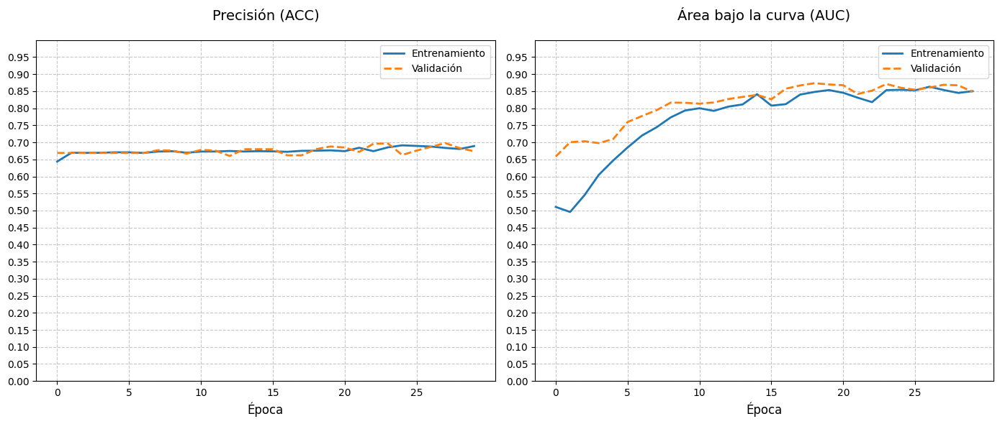

In [65]:
graficar_metricas(train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist)

Limpiar memoria

In [66]:
liberar_memoria_gpu()

Memoria libre: 35.62 GB


---

# 13. ViT vit_b_16 de Google preentrenado con ImageNet

> - Train -> ACC=  AUC=  
> - Val ----> ACC=  AUC=  
> - Test --> ACC=  AUC=  

Layers where kernel_size(k), padding(p) and stride(s):

\begin{array}{l}
\text{Input: 224x224x3} \\
\downarrow \\
\text{Patch Embedding (16x16)} \rightarrow \text{196 patches} \rightarrow \mathrm{Linear_{768}} \\
\downarrow \\
\text{Concat [class\_token]} \rightarrow \text{Add Positional Embeddings} \rightarrow \mathrm{Dropout_{10\%}} \\
\downarrow \\
\begin{array}{|l|}
\hline
\text{Transformer Encoder (x6 layers):} \\
\quad \text{LayerNorm} \rightarrow \mathrm{MultiHeadAttention_{8\,heads}} \rightarrow \mathrm{Dropout_{10\%}} \\
\quad \text{Add \& Norm} \\
\quad \mathrm{MLP_{3072}} \rightarrow \text{GELU} \rightarrow \mathrm{Dropout_{10\%}} \rightarrow \mathrm{Linear_{768}} \\
\quad \text{Add \& Norm} \\
\hline
\end{array} \\
\downarrow \\
\text{Extract [class\_token]} \rightarrow \mathrm{LayerNorm} \rightarrow \mathrm{Linear_{7}} \\
\downarrow \\
\text{Output: num\_classes}
\end{array}

Arquitectura del modelo MLP

In [67]:
# Verificar dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Configuración del modelo (parámetros originales del paper)
model = models.vit_b_16(
    weights=models.ViT_B_16_Weights.IMAGENET1K_V1
).to(device)

# Modificar la ultima capa
patch_size = 16
in_channels = 3
model.heads = nn.Sequential(
    nn.Linear(in_features=patch_size**2 * in_channels, out_features=num_classes).to(device)
)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

Entrenamiento del modelo con validacion

In [68]:
train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist = entrenar_modelo(
    model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    num_epochs,
    device
)

Época 1/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.47batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 1/30:
Entrenamiento - ACC: 0.6368 | AUC: 0.5815
Validación    - ACC: 0.6690 | AUC: 0.7619



Época 2/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.670]



RESUMEN ÉPOCA 2/30:
Entrenamiento - ACC: 0.6699 | AUC: 0.7294
Validación    - ACC: 0.6700 | AUC: 0.8006



Época 3/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.47batch/s, precisión_lote=0.670]



RESUMEN ÉPOCA 3/30:
Entrenamiento - ACC: 0.6793 | AUC: 0.7836
Validación    - ACC: 0.6700 | AUC: 0.8198



Época 4/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.45batch/s, precisión_lote=0.688]



RESUMEN ÉPOCA 4/30:
Entrenamiento - ACC: 0.6823 | AUC: 0.8022
Validación    - ACC: 0.6879 | AUC: 0.8523



Época 5/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.46batch/s, precisión_lote=0.681]



RESUMEN ÉPOCA 5/30:
Entrenamiento - ACC: 0.6880 | AUC: 0.8230
Validación    - ACC: 0.6810 | AUC: 0.8464



Época 6/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.688]



RESUMEN ÉPOCA 6/30:
Entrenamiento - ACC: 0.6896 | AUC: 0.8358
Validación    - ACC: 0.6879 | AUC: 0.8731



Época 7/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.47batch/s, precisión_lote=0.706]



RESUMEN ÉPOCA 7/30:
Entrenamiento - ACC: 0.6892 | AUC: 0.8521
Validación    - ACC: 0.7059 | AUC: 0.8889



Época 8/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.719]



RESUMEN ÉPOCA 8/30:
Entrenamiento - ACC: 0.6936 | AUC: 0.8628
Validación    - ACC: 0.7188 | AUC: 0.8949



Época 9/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.47batch/s, precisión_lote=0.728]



RESUMEN ÉPOCA 9/30:
Entrenamiento - ACC: 0.7043 | AUC: 0.8802
Validación    - ACC: 0.7278 | AUC: 0.9076



Época 10/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.742]



RESUMEN ÉPOCA 10/30:
Entrenamiento - ACC: 0.7164 | AUC: 0.8959
Validación    - ACC: 0.7418 | AUC: 0.9182



Época 11/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.46batch/s, precisión_lote=0.733]



RESUMEN ÉPOCA 11/30:
Entrenamiento - ACC: 0.7243 | AUC: 0.9022
Validación    - ACC: 0.7328 | AUC: 0.9126



Época 12/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.743]



RESUMEN ÉPOCA 12/30:
Entrenamiento - ACC: 0.7179 | AUC: 0.8992
Validación    - ACC: 0.7428 | AUC: 0.9208



Época 13/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.46batch/s, precisión_lote=0.748]



RESUMEN ÉPOCA 13/30:
Entrenamiento - ACC: 0.7347 | AUC: 0.9109
Validación    - ACC: 0.7478 | AUC: 0.9164



Época 14/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.42batch/s, precisión_lote=0.760]



RESUMEN ÉPOCA 14/30:
Entrenamiento - ACC: 0.7461 | AUC: 0.9204
Validación    - ACC: 0.7597 | AUC: 0.9229



Época 15/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.45batch/s, precisión_lote=0.752]



RESUMEN ÉPOCA 15/30:
Entrenamiento - ACC: 0.7483 | AUC: 0.9187
Validación    - ACC: 0.7517 | AUC: 0.9301



Época 16/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.45batch/s, precisión_lote=0.713]



RESUMEN ÉPOCA 16/30:
Entrenamiento - ACC: 0.7428 | AUC: 0.9201
Validación    - ACC: 0.7129 | AUC: 0.9260



Época 17/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.45batch/s, precisión_lote=0.755]



RESUMEN ÉPOCA 17/30:
Entrenamiento - ACC: 0.7417 | AUC: 0.9152
Validación    - ACC: 0.7547 | AUC: 0.9317



Época 18/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.745]



RESUMEN ÉPOCA 18/30:
Entrenamiento - ACC: 0.7601 | AUC: 0.9330
Validación    - ACC: 0.7448 | AUC: 0.9290



Época 19/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.47batch/s, precisión_lote=0.761]



RESUMEN ÉPOCA 19/30:
Entrenamiento - ACC: 0.7618 | AUC: 0.9326
Validación    - ACC: 0.7607 | AUC: 0.9337



Época 20/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.748]



RESUMEN ÉPOCA 20/30:
Entrenamiento - ACC: 0.7699 | AUC: 0.9368
Validación    - ACC: 0.7478 | AUC: 0.9210



Época 21/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.46batch/s, precisión_lote=0.768]



RESUMEN ÉPOCA 21/30:
Entrenamiento - ACC: 0.7715 | AUC: 0.9359
Validación    - ACC: 0.7677 | AUC: 0.9307



Época 22/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.767]



RESUMEN ÉPOCA 22/30:
Entrenamiento - ACC: 0.7799 | AUC: 0.9395
Validación    - ACC: 0.7667 | AUC: 0.9346



Época 23/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.773]



RESUMEN ÉPOCA 23/30:
Entrenamiento - ACC: 0.7814 | AUC: 0.9421
Validación    - ACC: 0.7727 | AUC: 0.9366



Época 24/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.47batch/s, precisión_lote=0.773]



RESUMEN ÉPOCA 24/30:
Entrenamiento - ACC: 0.7924 | AUC: 0.9456
Validación    - ACC: 0.7727 | AUC: 0.9311



Época 25/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.745]



RESUMEN ÉPOCA 25/30:
Entrenamiento - ACC: 0.7691 | AUC: 0.9413
Validación    - ACC: 0.7448 | AUC: 0.9309



Época 26/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.47batch/s, precisión_lote=0.781]



RESUMEN ÉPOCA 26/30:
Entrenamiento - ACC: 0.7905 | AUC: 0.9490
Validación    - ACC: 0.7807 | AUC: 0.9363



Época 27/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.45batch/s, precisión_lote=0.763]



RESUMEN ÉPOCA 27/30:
Entrenamiento - ACC: 0.7904 | AUC: 0.9500
Validación    - ACC: 0.7627 | AUC: 0.9390



Época 28/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.46batch/s, precisión_lote=0.772]



RESUMEN ÉPOCA 28/30:
Entrenamiento - ACC: 0.7952 | AUC: 0.9514
Validación    - ACC: 0.7717 | AUC: 0.9377



Época 29/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.750]



RESUMEN ÉPOCA 29/30:
Entrenamiento - ACC: 0.7991 | AUC: 0.9545
Validación    - ACC: 0.7498 | AUC: 0.9273



Época 30/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.46batch/s, precisión_lote=0.755]


RESUMEN ÉPOCA 30/30:
Entrenamiento - ACC: 0.8008 | AUC: 0.9551
Validación    - ACC: 0.7547 | AUC: 0.9341



Evaluacion conjunto de prueba

In [69]:
evaluar_modelo(model, test_loader, device)


Métricas finales en prueba:
ACC: 0.7651  AUC: 0.9352


Grafica de precision y area bajo la curva

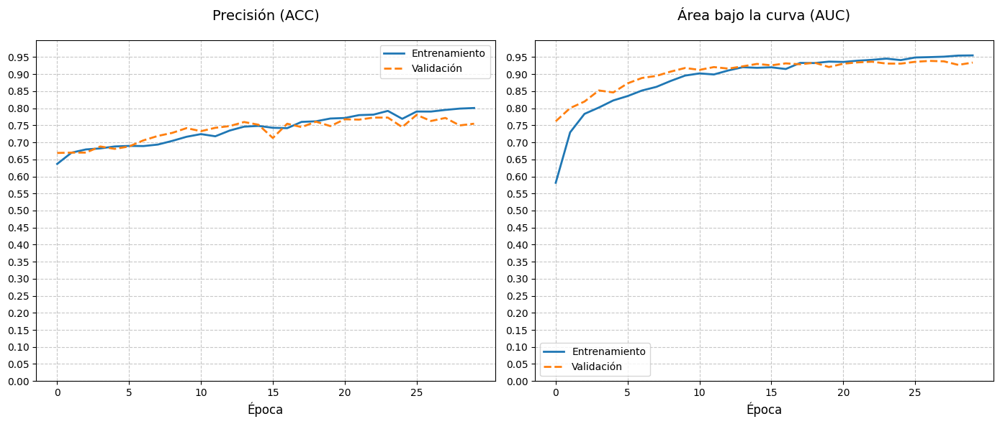

In [70]:
graficar_metricas(train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist)

Limpiar memoria

In [71]:
liberar_memoria_gpu()

Memoria libre: 36.20 GB


---

# 14. ViT Data-Augmentation vit_b_16 de Google preentrenado con ImageNet

> - Train -> ACC=  AUC=  
> - Val ----> ACC=  AUC=  
> - Test --> ACC=  AUC=  

Layers where kernel_size(k), padding(p) and stride(s):

\begin{array}{l}
\text{Input: 224x224x3} \\
\downarrow \\
\text{Patch Embedding (16x16)} \rightarrow \text{196 patches} \rightarrow \mathrm{Linear_{768}} \\
\downarrow \\
\text{Concat [class\_token]} \rightarrow \text{Add Positional Embeddings} \rightarrow \mathrm{Dropout_{10\%}} \\
\downarrow \\
\begin{array}{|l|}
\hline
\text{Transformer Encoder (x6 layers):} \\
\quad \text{LayerNorm} \rightarrow \mathrm{MultiHeadAttention_{8\,heads}} \rightarrow \mathrm{Dropout_{10\%}} \\
\quad \text{Add \& Norm} \\
\quad \mathrm{MLP_{3072}} \rightarrow \text{GELU} \rightarrow \mathrm{Dropout_{10\%}} \rightarrow \mathrm{Linear_{768}} \\
\quad \text{Add \& Norm} \\
\hline
\end{array} \\
\downarrow \\
\text{Extract [class\_token]} \rightarrow \mathrm{LayerNorm} \rightarrow \mathrm{Linear_{7}} \\
\downarrow \\
\text{Output: num\_classes}
\end{array}

Arquitectura del modelo MLP

In [72]:
# Verificar dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Configuración del modelo (parámetros originales del paper)
model = models.vit_b_16(
    weights=models.ViT_B_16_Weights.IMAGENET1K_V1
).to(device)

# Modificar la ultima capa
patch_size = 16
in_channels = 3
model.heads = nn.Sequential(
    nn.Linear(in_features=patch_size**2 * in_channels, out_features=num_classes).to(device)
)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

Entrenamiento del modelo con validacion

In [73]:
train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist = entrenar_modelo(
    model,
    trainAUG_loader,
    val_loader,
    criterion,
    optimizer,
    num_epochs,
    device
)

Época 1/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.669]



RESUMEN ÉPOCA 1/30:
Entrenamiento - ACC: 0.6398 | AUC: 0.5146
Validación    - ACC: 0.6690 | AUC: 0.7429



Época 2/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.45batch/s, precisión_lote=0.679]



RESUMEN ÉPOCA 2/30:
Entrenamiento - ACC: 0.6690 | AUC: 0.6968
Validación    - ACC: 0.6790 | AUC: 0.8040



Época 3/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.680]



RESUMEN ÉPOCA 3/30:
Entrenamiento - ACC: 0.6729 | AUC: 0.7905
Validación    - ACC: 0.6800 | AUC: 0.8550



Época 4/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.703]



RESUMEN ÉPOCA 4/30:
Entrenamiento - ACC: 0.6810 | AUC: 0.8211
Validación    - ACC: 0.7029 | AUC: 0.8670



Época 5/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.45batch/s, precisión_lote=0.683]



RESUMEN ÉPOCA 5/30:
Entrenamiento - ACC: 0.6889 | AUC: 0.8413
Validación    - ACC: 0.6830 | AUC: 0.8790



Época 6/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.46batch/s, precisión_lote=0.701]



RESUMEN ÉPOCA 6/30:
Entrenamiento - ACC: 0.6903 | AUC: 0.8523
Validación    - ACC: 0.7009 | AUC: 0.8902



Época 7/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.46batch/s, precisión_lote=0.704]



RESUMEN ÉPOCA 7/30:
Entrenamiento - ACC: 0.6960 | AUC: 0.8648
Validación    - ACC: 0.7039 | AUC: 0.8998



Época 8/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.45batch/s, precisión_lote=0.724]



RESUMEN ÉPOCA 8/30:
Entrenamiento - ACC: 0.7020 | AUC: 0.8709
Validación    - ACC: 0.7238 | AUC: 0.9021



Época 9/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.46batch/s, precisión_lote=0.714]



RESUMEN ÉPOCA 9/30:
Entrenamiento - ACC: 0.7003 | AUC: 0.8820
Validación    - ACC: 0.7139 | AUC: 0.9077



Época 10/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.47batch/s, precisión_lote=0.712]



RESUMEN ÉPOCA 10/30:
Entrenamiento - ACC: 0.7127 | AUC: 0.8909
Validación    - ACC: 0.7119 | AUC: 0.9049



Época 11/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.46batch/s, precisión_lote=0.737]



RESUMEN ÉPOCA 11/30:
Entrenamiento - ACC: 0.7110 | AUC: 0.8899
Validación    - ACC: 0.7368 | AUC: 0.9175



Época 12/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.45batch/s, precisión_lote=0.734]



RESUMEN ÉPOCA 12/30:
Entrenamiento - ACC: 0.7210 | AUC: 0.8996
Validación    - ACC: 0.7338 | AUC: 0.9148



Época 13/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.45batch/s, precisión_lote=0.751]



RESUMEN ÉPOCA 13/30:
Entrenamiento - ACC: 0.7246 | AUC: 0.9056
Validación    - ACC: 0.7507 | AUC: 0.9250



Época 14/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.708]



RESUMEN ÉPOCA 14/30:
Entrenamiento - ACC: 0.7336 | AUC: 0.9095
Validación    - ACC: 0.7079 | AUC: 0.9255



Época 15/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.47batch/s, precisión_lote=0.763]



RESUMEN ÉPOCA 15/30:
Entrenamiento - ACC: 0.7331 | AUC: 0.9149
Validación    - ACC: 0.7627 | AUC: 0.9299



Época 16/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.45batch/s, precisión_lote=0.762]



RESUMEN ÉPOCA 16/30:
Entrenamiento - ACC: 0.7401 | AUC: 0.9138
Validación    - ACC: 0.7617 | AUC: 0.9224



Época 17/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.748]



RESUMEN ÉPOCA 17/30:
Entrenamiento - ACC: 0.7485 | AUC: 0.9230
Validación    - ACC: 0.7478 | AUC: 0.9303



Época 18/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.761]



RESUMEN ÉPOCA 18/30:
Entrenamiento - ACC: 0.7433 | AUC: 0.9190
Validación    - ACC: 0.7607 | AUC: 0.9326



Época 19/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.740]



RESUMEN ÉPOCA 19/30:
Entrenamiento - ACC: 0.7588 | AUC: 0.9278
Validación    - ACC: 0.7398 | AUC: 0.9256



Época 20/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.46batch/s, precisión_lote=0.760]



RESUMEN ÉPOCA 20/30:
Entrenamiento - ACC: 0.7610 | AUC: 0.9295
Validación    - ACC: 0.7597 | AUC: 0.9342



Época 21/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.762]



RESUMEN ÉPOCA 21/30:
Entrenamiento - ACC: 0.7600 | AUC: 0.9312
Validación    - ACC: 0.7617 | AUC: 0.9338



Época 22/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.46batch/s, precisión_lote=0.749]



RESUMEN ÉPOCA 22/30:
Entrenamiento - ACC: 0.7638 | AUC: 0.9332
Validación    - ACC: 0.7488 | AUC: 0.9364



Época 23/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.761]



RESUMEN ÉPOCA 23/30:
Entrenamiento - ACC: 0.7701 | AUC: 0.9338
Validación    - ACC: 0.7607 | AUC: 0.9342



Época 24/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.758]



RESUMEN ÉPOCA 24/30:
Entrenamiento - ACC: 0.7717 | AUC: 0.9419
Validación    - ACC: 0.7577 | AUC: 0.9364



Época 25/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.46batch/s, precisión_lote=0.765]



RESUMEN ÉPOCA 25/30:
Entrenamiento - ACC: 0.7684 | AUC: 0.9380
Validación    - ACC: 0.7647 | AUC: 0.9371



Época 26/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.43batch/s, precisión_lote=0.782]



RESUMEN ÉPOCA 26/30:
Entrenamiento - ACC: 0.7811 | AUC: 0.9400
Validación    - ACC: 0.7817 | AUC: 0.9347



Época 27/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.47batch/s, precisión_lote=0.737]



RESUMEN ÉPOCA 27/30:
Entrenamiento - ACC: 0.7777 | AUC: 0.9440
Validación    - ACC: 0.7368 | AUC: 0.9284



Época 28/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.47batch/s, precisión_lote=0.762]



RESUMEN ÉPOCA 28/30:
Entrenamiento - ACC: 0.7798 | AUC: 0.9404
Validación    - ACC: 0.7617 | AUC: 0.9345



Época 29/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.46batch/s, precisión_lote=0.758]



RESUMEN ÉPOCA 29/30:
Entrenamiento - ACC: 0.7825 | AUC: 0.9446
Validación    - ACC: 0.7577 | AUC: 0.9370



Época 30/30 [Validación]: 100%|██████████| 4/4 [00:02<00:00,  1.44batch/s, precisión_lote=0.773]


RESUMEN ÉPOCA 30/30:
Entrenamiento - ACC: 0.7912 | AUC: 0.9498
Validación    - ACC: 0.7727 | AUC: 0.9339



Evaluacion conjunto de prueba

In [74]:
evaluar_modelo(model, test_loader, device)


Métricas finales en prueba:
ACC: 0.7631  AUC: 0.9360


Grafica de precision y area bajo la curva

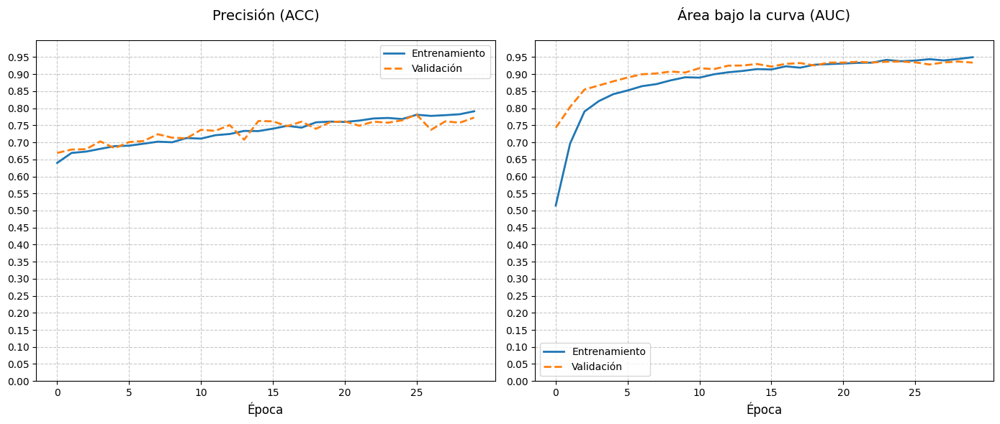

In [75]:
graficar_metricas(train_acc_hist, val_acc_hist, train_auc_hist, val_auc_hist)

Limpiar memoria

In [76]:
liberar_memoria_gpu()

Memoria libre: 35.33 GB


# Citation

1.   Jiancheng Yang, Rui Shi, Donglai Wei, Zequan Liu, Lin Zhao, Bilian Ke, Hanspeter Pfister, Bingbing Ni. Yang, Jiancheng, et al. "MedMNIST v2-A large-scale lightweight benchmark for 2D and 3D biomedical image classification." Scientific Data, 2023.

2.   Jiancheng Yang, Rui Shi, Bingbing Ni. "MedMNIST Classification Decathlon: A Lightweight AutoML Benchmark for Medical Image Analysis". IEEE 18th International Symposium on Biomedical Imaging (ISBI), 2021.